# Two-Stage Training: Severstal Pre-training → Galicia Fine-tuning

**Fase 1**: Pre-entrenar con Severstal (6,666 imágenes) para aprender patrones genéricos de defectos en acero  
**Fase 2**: Fine-tune con Galicia (14 imágenes) para especializar en defectos específicos

**Respuesta a tu pregunta**: UNet++ con ResNet34 pre-entrenado **SÍ necesita 3 canales RGB** (ImageNet). Las imágenes de Galicia son RGB, así que no hay problema.

In [2]:
!pip install segmentation-models-pytorch albumentations

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 4.5 MB/s eta 0:00:00


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
# URL del dataset
zip_url = 'https://huggingface.co/datasets/rohanath/severstal-steel-detection/resolve/main/Severstal%20Steel%20Defect%20Detection.zip'



# 1. Descargar el ZIP (lo descargamos temporalmente en /content)
print("Descargando archivo ZIP...")
!wget -O severstal_steel_detection.zip $zip_url


Descargando archivo ZIP...
--2025-12-07 19:30:45--  https://huggingface.co/datasets/rohanath/severstal-steel-detection/resolve/main/Severstal%20Steel%20Defect%20Detection.zip
Resolving huggingface.co (huggingface.co)... 3.171.171.6, 3.171.171.128, 3.171.171.65, ...
Connecting to huggingface.co (huggingface.co)|3.171.171.6|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://us.gcp.cdn.hf.co/xet-bridge-us/68974552a4dbfa7414d73ca6/ad86142be80c3402759952836d79c2a0a8e43af08ca714ae6724b4eaf648fedf?response-content-disposition=inline%3B+filename*%3DUTF-8%27%27Severstal%252520Steel%252520Defect%252520Detection.zip%3B+filename%3D%22Severstal%2520Steel%2520Defect%2520Detection.zip%22%3B&response-content-type=application%2Fzip&Expires=1765139445&Policy=eyJTdGF0ZW1lbnQiOlt7IkNvbmRpdGlvbiI6eyJEYXRlTGVzc1RoYW4iOnsiRXBvY2hUaW1lIjoxNzY1MTM5NDQ1fX0sIlJlc291cmNlIjoiaHR0cHM6Ly91cy5nY3AuY2RuLmhmLmNvL3hldC1icmlkZ2UtdXMvNjg5NzQ1NTJhNGRiZmE3NDE0ZDczY2E2L2FkODYxNDJiZTgwYzM0M

In [5]:

# Ruta donde se guardará el dataset DENTRO de tu Drive
drive_path = '/content/drive/MyDrive/severstal'
!mkdir -p "$drive_path"

# 4. Descomprimir el archivo directamente en la ruta de Drive
print(f"Descomprimiendo en: {drive_path}...")
!unzip severstal_steel_detection.zip -d $drive_path

Se han truncado las últimas 5000 líneas del flujo de salida.
 extracting: /content/drive/MyDrive/severstal/severstal-steel-defect-detection/val/labels/89c28225d.txt  
  inflating: /content/drive/MyDrive/severstal/__MACOSX/severstal-steel-defect-detection/val/labels/._89c28225d.txt  
 extracting: /content/drive/MyDrive/severstal/severstal-steel-defect-detection/val/labels/4a00eaee7.txt  
  inflating: /content/drive/MyDrive/severstal/__MACOSX/severstal-steel-defect-detection/val/labels/._4a00eaee7.txt  
 extracting: /content/drive/MyDrive/severstal/severstal-steel-defect-detection/val/labels/7ec438623.txt  
  inflating: /content/drive/MyDrive/severstal/__MACOSX/severstal-steel-defect-detection/val/labels/._7ec438623.txt  
 extracting: /content/drive/MyDrive/severstal/severstal-steel-defect-detection/val/labels/1aa7e1c47.txt  
  inflating: /content/drive/MyDrive/severstal/__MACOSX/severstal-steel-defect-detection/val/labels/._1aa7e1c47.txt  
 extracting: /content/drive/MyDrive/severstal/s

In [6]:
# Ruta donde se guardará el dataset DENTRO de tu Drive
drive_path = '/content/drive/MyDrive/unet_dataset'
!mkdir -p "$drive_path"

# 4. Descomprimir el archivo directamente en la ruta de Drive
print(f"Descomprimiendo en: {drive_path}...")
!unzip /content/drive/MyDrive/datasets.zip -d $drive_path

Descomprimiendo en: /content/drive/MyDrive/unet_dataset...
Archive:  /content/drive/MyDrive/datasets.zip
   creating: /content/drive/MyDrive/unet_dataset/datasets/
   creating: /content/drive/MyDrive/unet_dataset/datasets/unet_dataset/
   creating: /content/drive/MyDrive/unet_dataset/datasets/unet_dataset/train/
   creating: /content/drive/MyDrive/unet_dataset/datasets/unet_dataset/train/images/
  inflating: /content/drive/MyDrive/unet_dataset/datasets/unet_dataset/train/images/imagenes_galicia_19.jpg  
  inflating: /content/drive/MyDrive/unet_dataset/datasets/unet_dataset/train/images/raw_image_toshiba_50.jpg  
  inflating: /content/drive/MyDrive/unet_dataset/datasets/unet_dataset/train/images/imagenes_galicia_26.jpg  
  inflating: /content/drive/MyDrive/unet_dataset/datasets/unet_dataset/train/images/raw_image_toshiba_25.jpg  
  inflating: /content/drive/MyDrive/unet_dataset/datasets/unet_dataset/train/images/raw_image_toshiba_44.jpg  
  inflating: /content/drive/MyDrive/unet_dataset

In [36]:
# ==========================================
# IMPORTS
# ==========================================
import os
import random
import numpy as np
import pandas as pd
import cv2
from glob import glob
from tqdm import tqdm
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2
import segmentation_models_pytorch as smp
from torch.cuda.amp import autocast, GradScaler # <--- ¡IMPORTANTE PARA A100!
print(f"PyTorch: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")


# Configuración del Scaler para Mixed Precision
scaler = GradScaler()

print(f"✅ Librerías cargadas. AMP activado para {torch.cuda.get_device_name(0)}")

PyTorch: 2.9.0+cu126
CUDA available: True
GPU: NVIDIA A100-SXM4-40GB
✅ Librerías cargadas. AMP activado para NVIDIA A100-SXM4-40GB


/tmp/ipython-input-1776448026.py:28: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()


In [37]:
# ==========================================
# CONFIGURACIÓN GLOBAL
# ==========================================
SEED = 42
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Rutas
SEVERSTAL_ROOT = '/content/drive/MyDrive/severstal/severstal-steel-defect-detection'
GALICIA_ROOT = '/content/drive/MyDrive/unet_dataset'

# Fase 1: Severstal Pre-training
PHASE1_EPOCHS = 30
PHASE1_BATCH = 16
PHASE1_LR = 1e-4
PHASE1_SIZE = 256  # Severstal images son 1600x256, resize a 256x256

# Fase 2: Galicia Fine-tuning
PHASE2_EPOCHS = 100
PHASE2_BATCH = 4
PHASE2_LR = 1e-5  # LR más bajo para fine-tuning
PHASE2_SIZE = 512  # Tiles de Galicia

# Modelo
ENCODER = 'resnet34'
ENCODER_WEIGHTS = 'imagenet'

# Seeds
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)

print(f"Device: {DEVICE}")
print(f"Severstal: {PHASE1_EPOCHS} epochs, batch {PHASE1_BATCH}, LR {PHASE1_LR}")
print(f"Galicia: {PHASE2_EPOCHS} epochs, batch {PHASE2_BATCH}, LR {PHASE2_LR}")

Device: cuda
Severstal: 30 epochs, batch 16, LR 0.0001
Galicia: 100 epochs, batch 4, LR 1e-05


---
## 📦 PARTE 1: Dataset Severstal (RLE Masks)
---

In [38]:
# ==========================================
# RLE DECODER (Severstal usa Run-Length Encoding)
# ==========================================
def rle_decode(mask_rle, shape=(256, 1600)):
    """
    Decode RLE string to binary mask
    mask_rle: RLE string (e.g., '1 3 10 5' means pixel 1-3, 10-14)
    shape: (height, width) de la imagen original
    """
    if pd.isna(mask_rle) or mask_rle == '':
        return np.zeros(shape, dtype=np.uint8)

    s = mask_rle.split()
    starts = np.array([int(s[i]) for i in range(0, len(s), 2)]) - 1  # RLE es 1-indexed
    lengths = np.array([int(s[i]) for i in range(1, len(s), 2)])
    ends = starts + lengths

    img = np.zeros(shape[0] * shape[1], dtype=np.uint8)
    for start, end in zip(starts, ends):
        img[start:end] = 1

    return img.reshape(shape, order='F')  # Fortran order (column-major)

# Test
test_mask = rle_decode('1 3 10 5', shape=(10, 10))
print(f"RLE test shape: {test_mask.shape}, non-zero: {test_mask.sum()}")

RLE test shape: (10, 10), non-zero: 8


In [39]:
# ==========================================
# PREPARAR DATOS SEVERSTAL
# ==========================================
df_train = pd.read_csv(os.path.join(SEVERSTAL_ROOT, 'train.csv'))
print(f"Total rows en train.csv: {len(df_train)}")
print(df_train.head())
# Limpiar nombres de columnas (eliminar espacios en blanco)
df_train.columns = df_train.columns.str.strip()
# Renombrar columnas
df_train = df_train.rename(columns={'ImageId': 'ImageID', 'ClassId': 'ClassID'})
# IMPORTANTE: Limpiar espacios en los valores de ImageID también
df_train['ImageID'] = df_train['ImageID'].str.strip()
# Convertir ClassID a int
df_train['ClassID'] = df_train['ClassID'].astype(int)
# Obtener imágenes únicas del CSV
img_ids_csv = df_train['ImageID'].unique()
print(f"Total imágenes únicas en CSV: {len(img_ids_csv)}")
# Filtrar solo las imágenes que existen en el directorio
img_dir = os.path.join(SEVERSTAL_ROOT, 'train', 'images')
existing_imgs = set(os.listdir(img_dir))
img_ids = [img_id for img_id in img_ids_csv if img_id in existing_imgs]
print(f"Total imágenes que existen en disco: {len(img_ids)}")
# Filtrar el dataframe para solo incluir imágenes existentes
df_train = df_train[df_train['ImageID'].isin(img_ids)]
print(f"Total rows después de filtrar: {len(df_train)}")
# Split train/val
train_ids, val_ids = train_test_split(img_ids, test_size=0.15, random_state=SEED)
print(f"Train: {len(train_ids)}, Val: {len(val_ids)}")

Total rows en train.csv: 7095
   ImageId         ClassId                                       EncodedPixels
0  0002cc93b.jpg          1  29102 12 29346 24 29602 24 29858 24 30114 24 3...
1  0007a71bf.jpg          3  18661 28 18863 82 19091 110 19347 110 19603 11...
2  000a4bcdd.jpg          1  37607 3 37858 8 38108 14 38359 20 38610 25 388...
3  000f6bf48.jpg          4  131973 1 132228 4 132483 6 132738 8 132993 11 ...
4  0014fce06.jpg          3  229501 11 229741 33 229981 55 230221 77 230468...
Total imágenes únicas en CSV: 6666
Total imágenes que existen en disco: 6666
Total rows después de filtrar: 7095
Train: 5666, Val: 1000


In [40]:
# ==========================================
# DATASET SEVERSTAL (OPTIMIZADO Y SIN RESIZE)
# ==========================================
class SeverStalDataset(Dataset):
    def __init__(self, img_ids, df, img_dir, transform=None):
        self.img_ids = img_ids
        self.img_dir = img_dir
        self.transform = transform

        # OPTIMIZACIÓN: Agrupar el DF por ImageID al inicio para no filtrar en cada iteración
        # Creamos un diccionario: { 'img_id.jpg': [ (ClassID, RLE), ... ] }
        self.rle_dict = {}
        grouped = df.groupby('ImageID')
        for img_id, group in tqdm(grouped, desc="Indexando RLEs"):
            if img_id in img_ids:
                self.rle_dict[img_id] = group[['ClassID', 'EncodedPixels']].values.tolist()

    def __len__(self):
        return len(self.img_ids)

    def __getitem__(self, idx):
        img_id = self.img_ids[idx]
        img_path = os.path.join(self.img_dir, img_id)

        # Leer imagen
        image = cv2.imread(img_path)
        if image is None:
             # Fallback simple para evitar crashes si falta una imagen
             return torch.zeros((3, 256, 256)), torch.zeros((256, 256)).long()

        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Crear máscara (shape original: 256x1600)
        mask = np.zeros((256, 1600), dtype=np.uint8)

        # Rellenar máscara usando el diccionario (mucho más rápido)
        if img_id in self.rle_dict:
            for class_id, rle in self.rle_dict[img_id]:
                class_id = int(class_id)
                if pd.notna(rle) and rle != '':
                    class_mask = rle_decode(rle, shape=(256, 1600))
                    mask[class_mask == 1] = class_id

        # Albumentations hace el RandomCrop (1600x256 -> 256x256)
        if self.transform:
            augmented = self.transform(image=image, mask=mask)
            image = augmented['image']
            mask = augmented['mask']

        return image, mask.long()

# Re-crear los DataLoaders
# NOTA: Aumenta num_workers a 4 para alimentar la A100 más rápido
train_ds_severstal = SeverStalDataset(train_ids, df_train, os.path.join(SEVERSTAL_ROOT, 'train/images'), transform=train_transform_phase1)
val_ds_severstal = SeverStalDataset(val_ids, df_train, os.path.join(SEVERSTAL_ROOT, 'train/images'), transform=val_transform_phase1)

train_loader_phase1 = DataLoader(train_ds_severstal, batch_size=PHASE1_BATCH, shuffle=True, num_workers=4, pin_memory=True)
val_loader_phase1 = DataLoader(val_ds_severstal, batch_size=PHASE1_BATCH, shuffle=False, num_workers=4, pin_memory=True)

print(f"✅ Severstal Train: {len(train_ds_severstal)} samples")
print(f"✅ Severstal Val: {len(val_ds_severstal)} samples")

Indexando RLEs: 100%|██████████| 6666/6666 [00:00<00:00, 10980.15it/s]

✅ Severstal Train: 5666 samples
✅ Severstal Val: 1000 samples


---
## 📦 PARTE 2: Dataset Galicia (PNG Masks)
---

In [41]:
# ==========================================
# SMART SAMPLING DATASET GALICIA (DINÁMICO)
# ==========================================
class GaliciaSmartDataset(Dataset):
    def __init__(self, root_dir, transform=None, tile_size=512, defect_ratio=0.6):
        self.root_dir = root_dir
        self.transform = transform
        self.tile_size = tile_size
        self.defect_ratio = defect_ratio

        self.img_dir = os.path.join(root_dir, 'images')
        self.mask_dir = os.path.join(root_dir, 'masks')
        self.images = sorted([f for f in os.listdir(self.img_dir) if f.endswith('.jpg')])

        # Pre-clasificar imágenes: ¿Tienen defecto o son fondo?
        self.defect_images = []
        self.background_images = []

        print("🔍 Indexando dataset Galicia...")
        for img_name in tqdm(self.images):
            mask_name = img_name.replace('.jpg', '.png')
            mask_path = os.path.join(self.mask_dir, mask_name)
            if os.path.exists(mask_path):
                # Leemos solo para comprobar si tiene defecto (max > 0)
                m = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
                if m is not None and m.max() > 0:
                    self.defect_images.append(img_name)
                else:
                    self.background_images.append(img_name)

        # Definimos longitud de época artificial (ej. 50 veces el número de imágenes reales)
        # Esto es para que en cada "epoch" vea muchos parches distintos
        self.epoch_len = len(self.images) * 50

    def __len__(self):
        return self.epoch_len

    def __getitem__(self, idx):
        # 1. Decidir aleatoriamente qué tipo de imagen queremos (Defecto vs Fondo)
        use_defect = (np.random.rand() < self.defect_ratio) and (len(self.defect_images) > 0)

        if use_defect:
            img_name = np.random.choice(self.defect_images)
        else:
            img_name = np.random.choice(self.background_images + self.defect_images) # Fallback

        # 2. Cargar
        img_path = os.path.join(self.img_dir, img_name)
        mask_path = os.path.join(self.mask_dir, img_name.replace('.jpg', '.png'))

        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

        h, w = mask.shape

        # 3. Calcular coordenadas DINÁMICAS (Aquí está la mejora)
        # Si elegimos imagen con defecto, intentamos centrar el crop en el defecto
        if use_defect:
            ys, xs = np.where(mask > 0)
            if len(ys) > 0:
                # Elegir un píxel de defecto aleatorio como centro aproximado
                center_idx = np.random.randint(len(ys))
                cy, cx = ys[center_idx], xs[center_idx]

                # Añadir ruido al centro para no recortar siempre igual
                jitter = self.tile_size // 4
                cy += np.random.randint(-jitter, jitter)
                cx += np.random.randint(-jitter, jitter)

                # Calcular coordenadas validas
                y1 = np.clip(cy - self.tile_size//2, 0, h - self.tile_size)
                x1 = np.clip(cx - self.tile_size//2, 0, w - self.tile_size)
            else:
                # Fallback si falla numpy
                y1 = np.random.randint(0, h - self.tile_size)
                x1 = np.random.randint(0, w - self.tile_size)
        else:
            # Crop totalmente aleatorio para background
            y1 = np.random.randint(0, max(1, h - self.tile_size))
            x1 = np.random.randint(0, max(1, w - self.tile_size))

        # Asegurar que las coordenadas son int y válidas
        y1, x1 = int(y1), int(x1)

        # 4. Crop
        image = image[y1:y1+self.tile_size, x1:x1+self.tile_size]
        mask = mask[y1:y1+self.tile_size, x1:x1+self.tile_size]

        # 5. Augmentations
        if self.transform:
            augmented = self.transform(image=image, mask=mask)
            image = augmented['image']
            mask = augmented['mask']

        return image, mask.long()

---
## 🔧 FUNCIONES DE ENTRENAMIENTO
---

In [49]:
# ==========================================
# MÉTRICAS
# ==========================================
def compute_iou(pred, target, num_classes):
    """
    Compute IoU per class
    """
    ious = []
    pred = pred.cpu().numpy()
    target = target.cpu().numpy()

    for cls in range(num_classes):
        pred_cls = (pred == cls)
        target_cls = (target == cls)

        intersection = np.logical_and(pred_cls, target_cls).sum()
        union = np.logical_or(pred_cls, target_cls).sum()

        if union == 0:
            ious.append(float('nan'))  # Clase no presente
        else:
            ious.append(intersection / union)

    return ious

# ==========================================
# TRAINING LOOP CON AMP (Mixed Precision)
# ==========================================

# 1. Definir Loss Híbrida (Dice + CrossEntropy)
# mode='multiclass' requiere targets como índices (Long), igual que CrossEntropy
dice_loss_fn = smp.losses.DiceLoss(mode='multiclass', from_logits=True)
ce_loss_fn = nn.CrossEntropyLoss()

def criterion_mixed(preds, targets):
    # Aseguramos que la loss sea la suma ponderada
    loss_dice = dice_loss_fn(preds, targets)
    loss_ce = ce_loss_fn(preds, targets)
    return 0.5 * loss_dice + 0.5 * loss_ce

# 2. Función de entrenamiento corregida
def train_one_epoch(model, loader, criterion, optimizer, scaler, device, num_classes):
    model.train()
    total_loss = 0
    all_ious = []

    # Barra de progreso
    pbar = tqdm(loader, desc='Training (AMP)')

    for images, masks in pbar:
        images = images.to(device).float()
        masks = masks.to(device).long() # Dice multiclass y CE necesitan Long

        optimizer.zero_grad()

        # --- BLOQUE AMP (Automatic Mixed Precision) ---
        # Usamos torch.cuda.amp.autocast para mayor seguridad
        with torch.cuda.amp.autocast(enabled=True):
            outputs = model(images)
            loss = criterion(outputs, masks)

        # Verificación de seguridad (opcional, evita crashes si explota el gradiente)
        if torch.isnan(loss):
            print("Warning: Loss is NaN, skipping batch")
            continue

        # Backpropagation escalado
        scaler.scale(loss).backward()

        # CORRECCIÓN IMPORTANTE AQUÍ:
        scaler.step(optimizer)
        scaler.update()
        # ---------------------------------------------

        total_loss += loss.item()

        # Métricas (fuera del autocast y sin gradientes para ahorrar VRAM)
        with torch.no_grad():
            preds = outputs.argmax(dim=1)
            # Asumimos que tienes definida la función compute_iou
            # Si compute_iou devuelve una lista por clase, np.nanmean gestiona bien el promedio
            batch_ious = compute_iou(preds, masks, num_classes)
            all_ious.append(batch_ious)

        pbar.set_postfix({'loss': f"{loss.item():.4f}"})

    # Cálculo de promedios finales
    avg_loss = total_loss / len(loader)

    # Manejo robusto de métricas con NumPy
    # axis=0 promedia sobre los batches para obtener IoU por clase
    avg_ious_per_class = np.nanmean(all_ious, axis=0)
    mean_iou = np.nanmean(avg_ious_per_class) # Promedio de todas las clases

    return avg_loss, mean_iou, avg_ious_per_class

# Actualizamos la definición de la loss global
criterion_phase1 = criterion_mixed
# ==========================================
# VALIDATION LOOP
# ==========================================
@torch.no_grad()
def validate(model, loader, criterion, device, num_classes):
    model.eval()
    total_loss = 0
    all_ious = []

    for images, masks in tqdm(loader, desc='Validation'):
        images = images.to(device).float()
        masks = masks.to(device).long()

        outputs = model(images)
        loss = criterion(outputs, masks)
        total_loss += loss.item()

        preds = outputs.argmax(dim=1)
        batch_ious = compute_iou(preds, masks, num_classes)
        all_ious.append(batch_ious)

    avg_loss = total_loss / len(loader)
    avg_ious = np.nanmean(all_ious, axis=0)
    mean_iou = np.nanmean(avg_ious)

    return avg_loss, mean_iou, avg_ious

---
# 🚀 FASE 1: PRE-ENTRENAMIENTO CON SEVERSTAL
---

In [50]:
# ==========================================
# AUGMENTATIONS FASE 1 (CORREGIDO: CROP vs RESIZE)
# ==========================================
# Las imágenes originales son 1600x256.
# En lugar de aplastarlas a 256x256, recortamos un trozo aleatorio de 256x256.

train_transform_phase1 = A.Compose([
    A.RandomCrop(height=256, width=256, p=1.0), # <--- ESTA ES LA CLAVE
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5), # Añadido vertical flip, ayuda en acero
    A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.5),
    A.GaussNoise(var_limit=(10, 50), p=0.3),
    A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ToTensorV2()
])

# Para validación, en lugar de random crop, podemos hacer un CenterCrop o
# (mejor aún) validar con crops deslizantes, pero por simplicidad usaremos CenterCrop aquí.
val_transform_phase1 = A.Compose([
    A.CenterCrop(height=256, width=256),
    A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ToTensorV2()
])

# ==========================================
# DATASETS & DATALOADERS FASE 1
# ==========================================
train_ds_severstal = SeverStalDataset(
    train_ids, df_train,
    os.path.join(SEVERSTAL_ROOT, 'train/images'),
    transform=train_transform_phase1,
    #img_size=PHASE1_SIZE
)

val_ds_severstal = SeverStalDataset(
    val_ids, df_train,
    os.path.join(SEVERSTAL_ROOT, 'train/images'),
    transform=val_transform_phase1,
    #img_size=PHASE1_SIZE
)

train_loader_phase1 = DataLoader(train_ds_severstal, batch_size=PHASE1_BATCH,
                                  shuffle=True, num_workers=2, pin_memory=True)
val_loader_phase1 = DataLoader(val_ds_severstal, batch_size=PHASE1_BATCH,
                                shuffle=False, num_workers=2, pin_memory=True)

print(f"✅ Severstal Train: {len(train_ds_severstal)} samples")
print(f"✅ Severstal Val: {len(val_ds_severstal)} samples")

/tmp/ipython-input-1548492869.py:12: UserWarning: Argument(s) 'var_limit' are not valid for transform GaussNoise
  A.GaussNoise(var_limit=(10, 50), p=0.3),
Indexando RLEs: 100%|██████████| 6666/6666 [00:00<00:00, 11079.99it/s]

✅ Severstal Train: 5666 samples
✅ Severstal Val: 1000 samples


In [51]:
# ==========================================
# MODELO FASE 1 (5 clases: 0=bg + 4 defectos)
# ==========================================
NUM_CLASSES_PHASE1 = 5  # Background + 4 defectos

model_phase1 = smp.UnetPlusPlus(
    encoder_name=ENCODER,
    encoder_weights=ENCODER_WEIGHTS,
    in_channels=3,
    classes=NUM_CLASSES_PHASE1
).to(DEVICE)

# Loss con class weights (Severstal está desbalanceado)
class_weights_phase1 = torch.tensor([0.5, 2.0, 2.0, 2.0, 2.0]).to(DEVICE)  # Penalizar defectos minoritarios
#criterion_phase1 = nn.CrossEntropyLoss(weight=class_weights_phase1)

optimizer_phase1 = torch.optim.AdamW(model_phase1.parameters(), lr=PHASE1_LR)
scheduler_phase1 = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_phase1, mode='max', patience=5, factor=0.5
)

print(f"✅ Modelo UNet++ con {ENCODER} creado")
print(f"✅ Clases Fase 1: {NUM_CLASSES_PHASE1}")

✅ Modelo UNet++ con resnet34 creado
✅ Clases Fase 1: 5


In [53]:
# ==========================================
# ENTRENAMIENTO FASE 1
# ==========================================
print("\n" + "="*60)
print("🚀 FASE 1: ENTRENAMIENTO CON SEVERSTAL")
print("="*60 + "\n")

# 1. INICIALIZAR EL SCALER PARA AMP
scaler = GradScaler() # <--- IMPORTANTE: Necesario para Mixed Precision

best_iou_phase1 = 0.0
history_phase1 = {'train_loss': [], 'val_loss': [], 'val_iou': []}

for epoch in range(PHASE1_EPOCHS):
    print(f"\nEpoch {epoch+1}/{PHASE1_EPOCHS}")
    print("-" * 60)

    # Train
    # AQUI ESTABA EL ERROR: Ahora pasamos 'scaler' como argumento
    train_loss, train_iou, train_ious = train_one_epoch(
        model_phase1,
        train_loader_phase1,
        criterion_phase1,
        optimizer_phase1,
        scaler,               # <--- NUEVO ARGUMENTO AÑADIDO
        DEVICE,
        NUM_CLASSES_PHASE1
    )

    # Val (La validación no suele necesitar scaler ni autocast para backward)
    val_loss, val_iou, val_ious = validate(
        model_phase1,
        val_loader_phase1,
        criterion_phase1,
        DEVICE,
        NUM_CLASSES_PHASE1
    )

    # Scheduler
    # Nota: Asegúrate de que tu scheduler espere 'val_iou' (mode='max') o 'val_loss' (mode='min')
    # Si es ReduceLROnPlateau y mode='min', usa val_loss. Si mode='max', usa val_iou.
    if isinstance(scheduler_phase1, torch.optim.lr_scheduler.ReduceLROnPlateau):
        scheduler_phase1.step(val_iou)
    else:
        scheduler_phase1.step()

    current_lr = optimizer_phase1.param_groups[0]['lr']

    # Log
    history_phase1['train_loss'].append(train_loss)
    history_phase1['val_loss'].append(val_loss)
    history_phase1['val_iou'].append(val_iou)

    print(f"Train Loss: {train_loss:.4f} | Train IoU: {train_iou:.4f}")
    print(f"Val Loss: {val_loss:.4f} | Val IoU: {val_iou:.4f}")
    # Formateo seguro para la lista de IoUs
    iou_str = [f'{x:.3f}' for x in val_ious] if isinstance(val_ious, (list, np.ndarray)) else f"{val_ious:.3f}"
    print(f"Val IoUs per class: {iou_str}")
    print(f"LR: {current_lr}")

    # Save best
    if val_iou > best_iou_phase1:
        best_iou_phase1 = val_iou
        torch.save(model_phase1.state_dict(), 'severstal_best.pth')
        print(f"✅ Guardado modelo con IoU: {best_iou_phase1:.4f}")

print(f"\n{'='*60}")
print(f"🎯 FASE 1 COMPLETADA - Mejor IoU: {best_iou_phase1:.4f}")
print(f"{'='*60}\n")

/tmp/ipython-input-641559222.py:9: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler() # <--- IMPORTANTE: Necesario para Mixed Precision



🚀 FASE 1: ENTRENAMIENTO CON SEVERSTAL


Epoch 1/30
------------------------------------------------------------


Training (AMP):   0%|          | 0/355 [00:00<?, ?it/s]/tmp/ipython-input-1131897335.py:58: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=True):
Validation: 100%|██████████| 63/63 [00:06<00:00,  9.07it/s]


Train Loss: 0.6342 | Train IoU: 0.2346
Val Loss: 0.3259 | Val IoU: 0.3465
Val IoUs per class: ['0.955', '0.000', '0.000', '0.495', '0.283']
LR: 0.0001
✅ Guardado modelo con IoU: 0.3465

Epoch 2/30
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:44<00:00,  1.40it/s]


Train Loss: 0.2913 | Train IoU: 0.3072
Val Loss: 0.2414 | Val IoU: 0.3715
Val IoUs per class: ['0.960', '0.000', '0.000', '0.500', '0.398']
LR: 0.0001
✅ Guardado modelo con IoU: 0.3715

Epoch 3/30
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:06<00:00,  9.21it/s]


Train Loss: 0.2391 | Train IoU: 0.3192
Val Loss: 0.1987 | Val IoU: 0.3747
Val IoUs per class: ['0.960', '0.000', '0.000', '0.540', '0.374']
LR: 0.0001
✅ Guardado modelo con IoU: 0.3747

Epoch 4/30
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:06<00:00,  9.59it/s]


Train Loss: 0.2204 | Train IoU: 0.3291
Val Loss: 0.3003 | Val IoU: 0.2895
Val IoUs per class: ['0.949', '0.000', '0.000', '0.347', '0.152']
LR: 0.0001

Epoch 5/30
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:06<00:00,  9.58it/s]


Train Loss: 0.2199 | Train IoU: 0.3299
Val Loss: 0.2118 | Val IoU: 0.3427
Val IoUs per class: ['0.956', '0.000', '0.000', '0.503', '0.253']
LR: 0.0001

Epoch 6/30
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:44<00:00,  1.41it/s]


Train Loss: 0.2164 | Train IoU: 0.3350
Val Loss: 0.2094 | Val IoU: 0.3578
Val IoUs per class: ['0.961', '0.120', '0.000', '0.453', '0.256']
LR: 0.0001

Epoch 7/30
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:06<00:00,  9.14it/s]


Train Loss: 0.1986 | Train IoU: 0.3477
Val Loss: 0.1783 | Val IoU: 0.4075
Val IoUs per class: ['0.956', '0.086', '0.000', '0.534', '0.462']
LR: 0.0001
✅ Guardado modelo con IoU: 0.4075

Epoch 8/30
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:47<00:00,  1.32it/s]


Train Loss: 0.1956 | Train IoU: 0.3557
Val Loss: 0.1610 | Val IoU: 0.4387
Val IoUs per class: ['0.964', '0.136', '0.000', '0.539', '0.554']
LR: 0.0001
✅ Guardado modelo con IoU: 0.4387

Epoch 9/30
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:07<00:00,  8.90it/s]


Train Loss: 0.1984 | Train IoU: 0.3549
Val Loss: 0.1638 | Val IoU: 0.4139
Val IoUs per class: ['0.961', '0.121', '0.000', '0.570', '0.417']
LR: 0.0001

Epoch 10/30
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:06<00:00,  9.27it/s]


Train Loss: 0.1886 | Train IoU: 0.3668
Val Loss: 0.1641 | Val IoU: 0.4216
Val IoUs per class: ['0.960', '0.128', '0.000', '0.551', '0.469']
LR: 0.0001

Epoch 11/30
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:07<00:00,  8.68it/s]


Train Loss: 0.1828 | Train IoU: 0.3674
Val Loss: 0.1597 | Val IoU: 0.4285
Val IoUs per class: ['0.960', '0.139', '0.000', '0.554', '0.490']
LR: 0.0001

Epoch 12/30
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:07<00:00,  8.24it/s]


Train Loss: 0.1884 | Train IoU: 0.3697
Val Loss: 0.1709 | Val IoU: 0.4288
Val IoUs per class: ['0.963', '0.192', '0.000', '0.544', '0.445']
LR: 0.0001

Epoch 13/30
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:07<00:00,  8.78it/s]


Train Loss: 0.1824 | Train IoU: 0.3688
Val Loss: 0.1466 | Val IoU: 0.4615
Val IoUs per class: ['0.964', '0.227', '0.000', '0.570', '0.546']
LR: 0.0001
✅ Guardado modelo con IoU: 0.4615

Epoch 14/30
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:06<00:00,  9.53it/s]


Train Loss: 0.1799 | Train IoU: 0.3728
Val Loss: 0.1483 | Val IoU: 0.4394
Val IoUs per class: ['0.964', '0.175', '0.000', '0.549', '0.509']
LR: 0.0001

Epoch 15/30
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:06<00:00,  9.59it/s]


Train Loss: 0.1708 | Train IoU: 0.3888
Val Loss: 0.1507 | Val IoU: 0.4382
Val IoUs per class: ['0.962', '0.185', '0.000', '0.566', '0.478']
LR: 0.0001

Epoch 16/30
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:07<00:00,  8.27it/s]


Train Loss: 0.1791 | Train IoU: 0.3804
Val Loss: 0.1492 | Val IoU: 0.4377
Val IoUs per class: ['0.962', '0.172', '0.000', '0.560', '0.495']
LR: 0.0001

Epoch 17/30
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:06<00:00,  9.68it/s]


Train Loss: 0.1799 | Train IoU: 0.3784
Val Loss: 0.1467 | Val IoU: 0.4582
Val IoUs per class: ['0.964', '0.215', '0.000', '0.567', '0.545']
LR: 0.0001

Epoch 18/30
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:07<00:00,  7.97it/s]


Train Loss: 0.1738 | Train IoU: 0.3789
Val Loss: 0.1498 | Val IoU: 0.4379
Val IoUs per class: ['0.965', '0.156', '0.000', '0.573', '0.495']
LR: 0.0001

Epoch 19/30
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:06<00:00,  9.87it/s]


Train Loss: 0.1741 | Train IoU: 0.3821
Val Loss: 0.1466 | Val IoU: 0.4366
Val IoUs per class: ['0.964', '0.173', '0.000', '0.574', '0.472']
LR: 5e-05

Epoch 20/30
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:08<00:00,  7.81it/s]


Train Loss: 0.1705 | Train IoU: 0.3930
Val Loss: 0.1424 | Val IoU: 0.4515
Val IoUs per class: ['0.966', '0.200', '0.000', '0.573', '0.519']
LR: 5e-05

Epoch 21/30
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:06<00:00,  9.71it/s]


Train Loss: 0.1605 | Train IoU: 0.3961
Val Loss: 0.1411 | Val IoU: 0.4519
Val IoUs per class: ['0.964', '0.185', '0.000', '0.582', '0.529']
LR: 5e-05

Epoch 22/30
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:08<00:00,  7.43it/s]


Train Loss: 0.1596 | Train IoU: 0.4009
Val Loss: 0.1417 | Val IoU: 0.4479
Val IoUs per class: ['0.966', '0.202', '0.000', '0.573', '0.499']
LR: 5e-05

Epoch 23/30
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:06<00:00,  9.77it/s]


Train Loss: 0.1586 | Train IoU: 0.4044
Val Loss: 0.1455 | Val IoU: 0.4391
Val IoUs per class: ['0.963', '0.181', '0.000', '0.575', '0.478']
LR: 5e-05

Epoch 24/30
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:08<00:00,  7.29it/s]


Train Loss: 0.1617 | Train IoU: 0.4036
Val Loss: 0.1384 | Val IoU: 0.4570
Val IoUs per class: ['0.965', '0.240', '0.000', '0.585', '0.495']
LR: 5e-05

Epoch 25/30
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:06<00:00,  9.85it/s]


Train Loss: 0.1594 | Train IoU: 0.4009
Val Loss: 0.1344 | Val IoU: 0.4625
Val IoUs per class: ['0.966', '0.235', '0.000', '0.587', '0.525']
LR: 5e-05
✅ Guardado modelo con IoU: 0.4625

Epoch 26/30
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:08<00:00,  7.23it/s]


Train Loss: 0.1551 | Train IoU: 0.4074
Val Loss: 0.1351 | Val IoU: 0.4602
Val IoUs per class: ['0.964', '0.246', '0.000', '0.582', '0.509']
LR: 5e-05

Epoch 27/30
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:06<00:00,  9.98it/s]


Train Loss: 0.1581 | Train IoU: 0.4023
Val Loss: 0.1324 | Val IoU: 0.4786
Val IoUs per class: ['0.966', '0.280', '0.000', '0.595', '0.552']
LR: 5e-05
✅ Guardado modelo con IoU: 0.4786

Epoch 28/30
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:08<00:00,  7.23it/s]


Train Loss: 0.1531 | Train IoU: 0.4132
Val Loss: 0.1351 | Val IoU: 0.4774
Val IoUs per class: ['0.964', '0.286', '0.000', '0.587', '0.548']
LR: 5e-05

Epoch 29/30
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:06<00:00,  9.89it/s]


Train Loss: 0.1632 | Train IoU: 0.3993
Val Loss: 0.1342 | Val IoU: 0.4691
Val IoUs per class: ['0.966', '0.276', '0.000', '0.591', '0.512']
LR: 5e-05

Epoch 30/30
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:09<00:00,  6.98it/s]

Train Loss: 0.1600 | Train IoU: 0.4049
Val Loss: 0.1326 | Val IoU: 0.4764
Val IoUs per class: ['0.967', '0.256', '0.000', '0.596', '0.563']
LR: 5e-05

🎯 FASE 1 COMPLETADA - Mejor IoU: 0.4786




📊 TESTING FASE 1 (Severstal)
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:45<00:00,  1.37it/s]


Test Loss: 0.1324
Test Mean IoU: 0.4786
Test IoU per class:
  Class 0: 0.9664
  Class 1: 0.2797
  Class 2: 0.0000
  Class 3: 0.5953
  Class 4: 0.5517


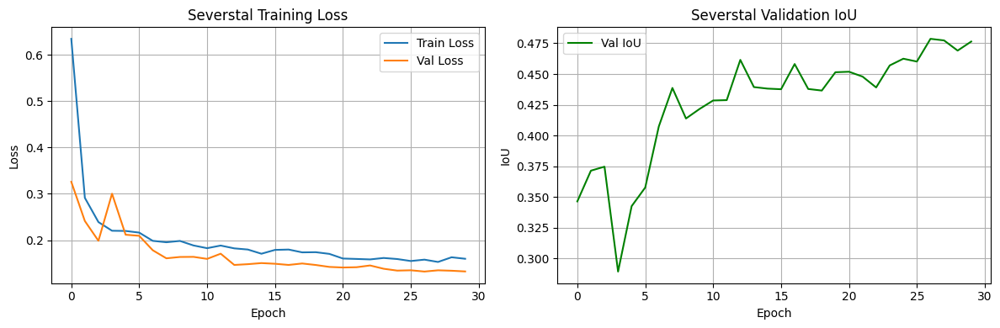

In [54]:
# ==========================================
# TESTING FASE 1
# ==========================================
print("\n📊 TESTING FASE 1 (Severstal)")
print("-" * 60)

# Cargar mejor modelo
model_phase1.load_state_dict(torch.load('severstal_best.pth'))

test_loss, test_iou, test_ious = validate(
    model_phase1, val_loader_phase1, criterion_phase1,
    DEVICE, NUM_CLASSES_PHASE1
)

print(f"Test Loss: {test_loss:.4f}")
print(f"Test Mean IoU: {test_iou:.4f}")
print(f"Test IoU per class:")
for i, iou in enumerate(test_ious):
    print(f"  Class {i}: {iou:.4f}")

# Plot training curves
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
ax1.plot(history_phase1['train_loss'], label='Train Loss')
ax1.plot(history_phase1['val_loss'], label='Val Loss')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Loss')
ax1.set_title('Severstal Training Loss')
ax1.legend()
ax1.grid(True)

ax2.plot(history_phase1['val_iou'], label='Val IoU', color='green')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('IoU')
ax2.set_title('Severstal Validation IoU')
ax2.legend()
ax2.grid(True)
plt.tight_layout()
plt.show()

In [55]:
import torch.optim as optim

# ==========================================
# 🚀 FASE 2: FINE-TUNING "ESTILO KAGGLE"
# ==========================================
print("\n" + "="*60)
print("⚔️ INICIANDO FASE 2: ESTRATEGIA SOTA (COSINE ANNEALING + PESOS)")
print("="*60 + "\n")

# 1. Cargar el mejor modelo de la Fase 1
# Es vital empezar desde donde lo dejaste
model_phase1.load_state_dict(torch.load('severstal_best.pth'))

# 2. LOSS AVANZADA (Weighted Focal + Dice)
# Los pesos obligan al modelo a mirar la clase 2 (x10 importancia)
# [Fondo, Cls1, Cls2, Cls3, Cls4]
class_weights = torch.tensor([0.1, 2.0, 10.0, 2.0, 2.0]).to(DEVICE)
ce_weighted = nn.CrossEntropyLoss(weight=class_weights)
dice_loss_fn = smp.losses.DiceLoss(mode='multiclass', from_logits=True)
focal_loss_fn = smp.losses.FocalLoss(mode='multiclass')

def criterion_phase2(preds, targets):
    # Mezcla robusta usada en competiciones
    return (0.4 * ce_weighted(preds, targets) +
            0.3 * dice_loss_fn(preds, targets) +
            0.3 * focal_loss_fn(preds, targets))

# 3. OPTIMIZADOR + SCHEDULER CICLICO
# LR base más bajo para no romper lo aprendido
optimizer_phase2 = torch.optim.AdamW(model_phase1.parameters(), lr=2e-5, weight_decay=1e-3)

# TRUCO PRO: CosineAnnealingWarmRestarts
# T_0=10: El LR baja y se reinicia cada 10 épocas.
# Esto ayuda a encontrar mínimos globales mejores que ReduceLROnPlateau
scheduler_phase2 = optim.lr_scheduler.CosineAnnealingWarmRestarts(
    optimizer_phase2, T_0=10, T_mult=2, eta_min=1e-7
)

# 4. ENTRENAMIENTO EXTENDIDO
PHASE2_EPOCHS = 40  # Más épocas, pero con reinicios de LR
best_iou_phase2 = best_iou_phase1

for epoch in range(PHASE2_EPOCHS):
    print(f"\nEpoch {epoch+1}/{PHASE2_EPOCHS} (Fine-Tuning)")
    print("-" * 60)

    # Train
    train_loss, train_iou, train_ious = train_one_epoch(
        model_phase1, train_loader_phase1, criterion_phase2,
        optimizer_phase2, scaler, DEVICE, NUM_CLASSES_PHASE1
    )

    # Val
    val_loss, val_iou, val_ious = validate(
        model_phase1, val_loader_phase1, criterion_phase2, DEVICE, NUM_CLASSES_PHASE1
    )

    # IMPORTANTE: El scheduler paso a paso (no depende de la métrica)
    scheduler_phase2.step()
    current_lr = optimizer_phase2.param_groups[0]['lr']

    # Logs
    print(f"Train Loss: {train_loss:.4f} | Train IoU: {train_iou:.4f}")
    print(f"Val Loss: {val_loss:.4f} | Val IoU: {val_iou:.4f}")

    iou_str = [f'{x:.3f}' for x in val_ious] if isinstance(val_ious, (list, np.ndarray)) else f"{val_ious:.3f}"
    print(f"Val IoUs per class: {iou_str}")
    print(f"LR: {current_lr:.7f}") # Verás como sube y baja

    # Guardar si mejora
    if val_iou > best_iou_phase2:
        best_iou_phase2 = val_iou
        torch.save(model_phase1.state_dict(), 'severstal_best_phase2.pth')
        print(f"🔥 ¡RÉCORD! Nuevo mejor modelo guardado: {best_iou_phase2:.4f}")

print(f"\n{'='*60}")
print(f"🏆 FASE 2 COMPLETADA - Mejor IoU Global: {best_iou_phase2:.4f}")


⚔️ INICIANDO FASE 2: ESTRATEGIA SOTA (COSINE ANNEALING + PESOS)


Epoch 1/40 (Fine-Tuning)
------------------------------------------------------------


Training (AMP):   0%|          | 0/355 [00:00<?, ?it/s]/tmp/ipython-input-1131897335.py:58: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=True):
Validation: 100%|██████████| 63/63 [00:06<00:00,  9.67it/s]


Train Loss: 0.2886 | Train IoU: 0.3767
Val Loss: 0.2085 | Val IoU: 0.4235
Val IoUs per class: ['0.944', '0.207', '0.000', '0.516', '0.451']
LR: 0.0000195

Epoch 2/40 (Fine-Tuning)
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:06<00:00,  9.58it/s]


Train Loss: 0.2407 | Train IoU: 0.3731
Val Loss: 0.2061 | Val IoU: 0.4061
Val IoUs per class: ['0.939', '0.188', '0.000', '0.499', '0.405']
LR: 0.0000181

Epoch 3/40 (Fine-Tuning)
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:06<00:00,  9.75it/s]


Train Loss: 0.2438 | Train IoU: 0.3716
Val Loss: 0.2007 | Val IoU: 0.4224
Val IoUs per class: ['0.945', '0.173', '0.000', '0.520', '0.474']
LR: 0.0000159

Epoch 4/40 (Fine-Tuning)
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:06<00:00,  9.76it/s]


Train Loss: 0.2427 | Train IoU: 0.3754
Val Loss: 0.1987 | Val IoU: 0.4146
Val IoUs per class: ['0.941', '0.176', '0.000', '0.508', '0.447']
LR: 0.0000131

Epoch 5/40 (Fine-Tuning)
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:06<00:00, 10.45it/s]


Train Loss: 0.2296 | Train IoU: 0.3732
Val Loss: 0.1980 | Val IoU: 0.4222
Val IoUs per class: ['0.944', '0.180', '0.000', '0.516', '0.471']
LR: 0.0000101

Epoch 6/40 (Fine-Tuning)
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:05<00:00, 10.72it/s]


Train Loss: 0.2387 | Train IoU: 0.3695
Val Loss: 0.1942 | Val IoU: 0.4219
Val IoUs per class: ['0.940', '0.197', '0.000', '0.502', '0.470']
LR: 0.0000070

Epoch 7/40 (Fine-Tuning)
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:05<00:00, 10.74it/s]


Train Loss: 0.2283 | Train IoU: 0.3712
Val Loss: 0.1934 | Val IoU: 0.4259
Val IoUs per class: ['0.946', '0.182', '0.000', '0.529', '0.471']
LR: 0.0000042

Epoch 8/40 (Fine-Tuning)
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:05<00:00, 10.84it/s]


Train Loss: 0.2217 | Train IoU: 0.3759
Val Loss: 0.1935 | Val IoU: 0.4067
Val IoUs per class: ['0.939', '0.161', '0.000', '0.511', '0.422']
LR: 0.0000020

Epoch 9/40 (Fine-Tuning)
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:45<00:00,  1.40it/s]


Train Loss: 0.2226 | Train IoU: 0.3752
Val Loss: 0.1906 | Val IoU: 0.4139
Val IoUs per class: ['0.941', '0.166', '0.000', '0.512', '0.451']
LR: 0.0000006

Epoch 10/40 (Fine-Tuning)
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:06<00:00, 10.02it/s]


Train Loss: 0.2314 | Train IoU: 0.3778
Val Loss: 0.1912 | Val IoU: 0.4237
Val IoUs per class: ['0.945', '0.188', '0.000', '0.527', '0.459']
LR: 0.0000200

Epoch 11/40 (Fine-Tuning)
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:06<00:00,  9.75it/s]


Train Loss: 0.2215 | Train IoU: 0.3772
Val Loss: 0.1903 | Val IoU: 0.4259
Val IoUs per class: ['0.941', '0.202', '0.000', '0.506', '0.481']
LR: 0.0000199

Epoch 12/40 (Fine-Tuning)
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:06<00:00,  9.67it/s]


Train Loss: 0.2378 | Train IoU: 0.3805
Val Loss: 0.1922 | Val IoU: 0.4305
Val IoUs per class: ['0.949', '0.166', '0.000', '0.539', '0.498']
LR: 0.0000195

Epoch 13/40 (Fine-Tuning)
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:44<00:00,  1.41it/s]


Train Loss: 0.2228 | Train IoU: 0.3778
Val Loss: 0.1876 | Val IoU: 0.4191
Val IoUs per class: ['0.938', '0.196', '0.000', '0.494', '0.468']
LR: 0.0000189

Epoch 14/40 (Fine-Tuning)
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:05<00:00, 10.62it/s]


Train Loss: 0.2289 | Train IoU: 0.3749
Val Loss: 0.1892 | Val IoU: 0.4433
Val IoUs per class: ['0.951', '0.224', '0.000', '0.550', '0.492']
LR: 0.0000181

Epoch 15/40 (Fine-Tuning)
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:05<00:00, 10.97it/s]


Train Loss: 0.2192 | Train IoU: 0.3830
Val Loss: 0.1883 | Val IoU: 0.4208
Val IoUs per class: ['0.944', '0.195', '0.000', '0.523', '0.442']
LR: 0.0000171

Epoch 16/40 (Fine-Tuning)
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:06<00:00,  9.48it/s]


Train Loss: 0.2261 | Train IoU: 0.3744
Val Loss: 0.1887 | Val IoU: 0.4213
Val IoUs per class: ['0.941', '0.210', '0.000', '0.508', '0.448']
LR: 0.0000159

Epoch 17/40 (Fine-Tuning)
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:06<00:00,  9.38it/s]


Train Loss: 0.2177 | Train IoU: 0.3841
Val Loss: 0.1850 | Val IoU: 0.4211
Val IoUs per class: ['0.942', '0.200', '0.000', '0.515', '0.448']
LR: 0.0000146

Epoch 18/40 (Fine-Tuning)
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:06<00:00,  9.55it/s]


Train Loss: 0.2191 | Train IoU: 0.3784
Val Loss: 0.1855 | Val IoU: 0.4276
Val IoUs per class: ['0.943', '0.232', '0.000', '0.520', '0.442']
LR: 0.0000131

Epoch 19/40 (Fine-Tuning)
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:06<00:00,  9.84it/s]


Train Loss: 0.2150 | Train IoU: 0.3844
Val Loss: 0.1780 | Val IoU: 0.4371
Val IoUs per class: ['0.944', '0.227', '0.000', '0.517', '0.497']
LR: 0.0000116

Epoch 20/40 (Fine-Tuning)
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:06<00:00, 10.46it/s]


Train Loss: 0.2161 | Train IoU: 0.3897
Val Loss: 0.1847 | Val IoU: 0.4383
Val IoUs per class: ['0.948', '0.215', '0.000', '0.535', '0.494']
LR: 0.0000101

Epoch 21/40 (Fine-Tuning)
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:05<00:00, 10.56it/s]


Train Loss: 0.2181 | Train IoU: 0.3766
Val Loss: 0.1810 | Val IoU: 0.4272
Val IoUs per class: ['0.945', '0.210', '0.000', '0.532', '0.448']
LR: 0.0000085

Epoch 22/40 (Fine-Tuning)
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:06<00:00, 10.49it/s]


Train Loss: 0.2101 | Train IoU: 0.3832
Val Loss: 0.1824 | Val IoU: 0.4165
Val IoUs per class: ['0.941', '0.188', '0.000', '0.515', '0.438']
LR: 0.0000070

Epoch 23/40 (Fine-Tuning)
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:46<00:00,  1.35it/s]


Train Loss: 0.2235 | Train IoU: 0.3812
Val Loss: 0.1807 | Val IoU: 0.4247
Val IoUs per class: ['0.944', '0.201', '0.000', '0.527', '0.451']
LR: 0.0000055

Epoch 24/40 (Fine-Tuning)
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:06<00:00, 10.43it/s]


Train Loss: 0.2117 | Train IoU: 0.3843
Val Loss: 0.1807 | Val IoU: 0.4249
Val IoUs per class: ['0.946', '0.193', '0.000', '0.536', '0.449']
LR: 0.0000042

Epoch 25/40 (Fine-Tuning)
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:46<00:00,  1.34it/s]


Train Loss: 0.2037 | Train IoU: 0.3947
Val Loss: 0.1791 | Val IoU: 0.4218
Val IoUs per class: ['0.942', '0.201', '0.000', '0.521', '0.445']
LR: 0.0000030

Epoch 26/40 (Fine-Tuning)
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:06<00:00,  9.67it/s]


Train Loss: 0.2058 | Train IoU: 0.3870
Val Loss: 0.1770 | Val IoU: 0.4281
Val IoUs per class: ['0.945', '0.209', '0.000', '0.528', '0.459']
LR: 0.0000020

Epoch 27/40 (Fine-Tuning)
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:07<00:00,  7.90it/s]


Train Loss: 0.2147 | Train IoU: 0.3904
Val Loss: 0.1788 | Val IoU: 0.4334
Val IoUs per class: ['0.948', '0.214', '0.000', '0.543', '0.462']
LR: 0.0000012

Epoch 28/40 (Fine-Tuning)
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:06<00:00,  9.76it/s]


Train Loss: 0.2045 | Train IoU: 0.3906
Val Loss: 0.1769 | Val IoU: 0.4312
Val IoUs per class: ['0.945', '0.219', '0.000', '0.530', '0.461']
LR: 0.0000006

Epoch 29/40 (Fine-Tuning)
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:06<00:00,  9.61it/s]


Train Loss: 0.2078 | Train IoU: 0.3962
Val Loss: 0.1782 | Val IoU: 0.4345
Val IoUs per class: ['0.948', '0.210', '0.000', '0.541', '0.472']
LR: 0.0000002

Epoch 30/40 (Fine-Tuning)
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:06<00:00,  9.52it/s]


Train Loss: 0.2019 | Train IoU: 0.3972
Val Loss: 0.1783 | Val IoU: 0.4295
Val IoUs per class: ['0.947', '0.208', '0.000', '0.536', '0.457']
LR: 0.0000200

Epoch 31/40 (Fine-Tuning)
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:06<00:00,  9.75it/s]


Train Loss: 0.2179 | Train IoU: 0.3885
Val Loss: 0.1810 | Val IoU: 0.4380
Val IoUs per class: ['0.941', '0.191', '0.000', '0.503', '0.555']
LR: 0.0000200

Epoch 32/40 (Fine-Tuning)
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:06<00:00,  9.55it/s]


Train Loss: 0.2234 | Train IoU: 0.3767
Val Loss: 0.1864 | Val IoU: 0.4370
Val IoUs per class: ['0.947', '0.210', '0.000', '0.527', '0.501']
LR: 0.0000199

Epoch 33/40 (Fine-Tuning)
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:06<00:00,  9.58it/s]


Train Loss: 0.2193 | Train IoU: 0.3776
Val Loss: 0.1800 | Val IoU: 0.4299
Val IoUs per class: ['0.939', '0.217', '0.000', '0.500', '0.493']
LR: 0.0000197

Epoch 34/40 (Fine-Tuning)
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:08<00:00,  7.26it/s]


Train Loss: 0.2092 | Train IoU: 0.3888
Val Loss: 0.1812 | Val IoU: 0.4228
Val IoUs per class: ['0.943', '0.199', '0.000', '0.518', '0.455']
LR: 0.0000195

Epoch 35/40 (Fine-Tuning)
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:05<00:00, 10.70it/s]


Train Loss: 0.2213 | Train IoU: 0.3813
Val Loss: 0.1815 | Val IoU: 0.4356
Val IoUs per class: ['0.942', '0.239', '0.005', '0.513', '0.478']
LR: 0.0000192

Epoch 36/40 (Fine-Tuning)
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:06<00:00,  9.49it/s]


Train Loss: 0.2160 | Train IoU: 0.3860
Val Loss: 0.1809 | Val IoU: 0.4353
Val IoUs per class: ['0.946', '0.184', '0.001', '0.525', '0.521']
LR: 0.0000189

Epoch 37/40 (Fine-Tuning)
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:06<00:00,  9.46it/s]


Train Loss: 0.2187 | Train IoU: 0.3906
Val Loss: 0.1757 | Val IoU: 0.4305
Val IoUs per class: ['0.942', '0.193', '0.009', '0.516', '0.492']
LR: 0.0000185

Epoch 38/40 (Fine-Tuning)
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:05<00:00, 10.63it/s]


Train Loss: 0.2074 | Train IoU: 0.3939
Val Loss: 0.1837 | Val IoU: 0.4227
Val IoUs per class: ['0.945', '0.185', '0.009', '0.536', '0.438']
LR: 0.0000181

Epoch 39/40 (Fine-Tuning)
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:05<00:00, 10.81it/s]


Train Loss: 0.2170 | Train IoU: 0.3894
Val Loss: 0.1782 | Val IoU: 0.4268
Val IoUs per class: ['0.940', '0.264', '0.010', '0.508', '0.411']
LR: 0.0000176

Epoch 40/40 (Fine-Tuning)
------------------------------------------------------------


Validation: 100%|██████████| 63/63 [00:05<00:00, 10.55it/s]

Train Loss: 0.2153 | Train IoU: 0.3908
Val Loss: 0.1786 | Val IoU: 0.4296
Val IoUs per class: ['0.941', '0.228', '0.018', '0.515', '0.445']
LR: 0.0000171

🏆 FASE 2 COMPLETADA - Mejor IoU Global: 0.4786


In [56]:
# ==========================================
# 💾 GUARDADO DE EMERGENCIA MANUAL
# ==========================================
# Ejecuta esto al terminar el bucle para asegurar que tienes el modelo final
torch.save(model_phase1.state_dict(), 'severstal_phase2_final.pth')
print("✅ Modelo de Fase 2 guardado manualmente como 'severstal_phase2_final.pth'")

✅ Modelo de Fase 2 guardado manualmente como 'severstal_phase2_final.pth'


🔄 Cargando Modelos...
✅ Modelo Fase 1 (Conservador) cargado.
✅ Modelo Fase 2 (Final) cargado.

🔎 Buscando ejemplos interesantes...


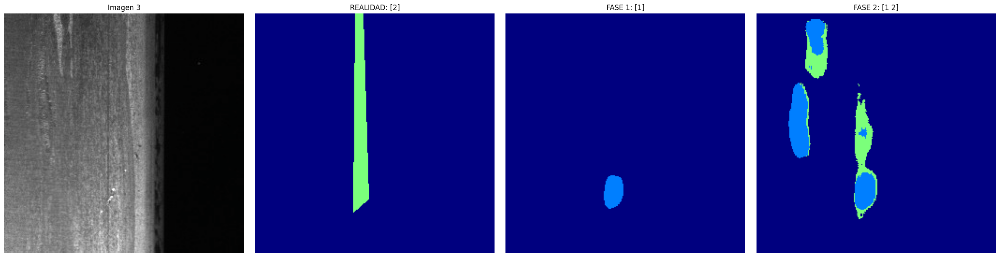

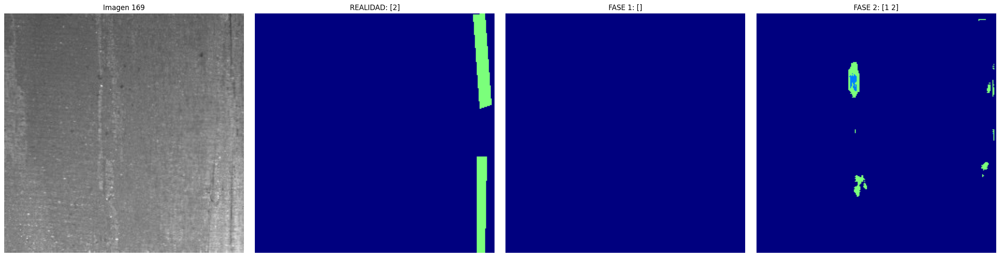

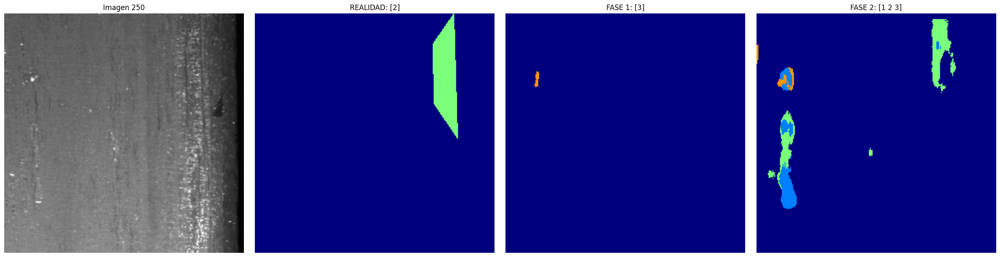

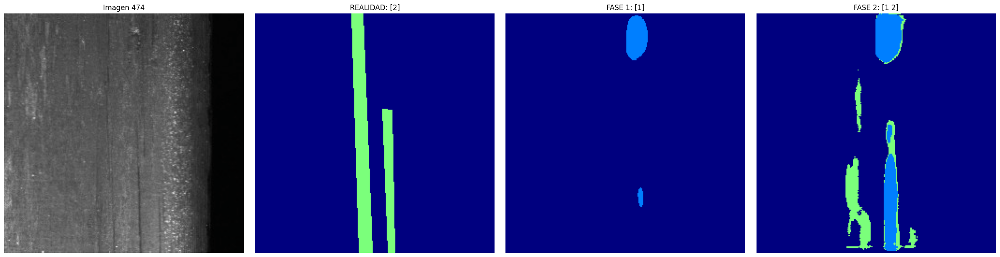

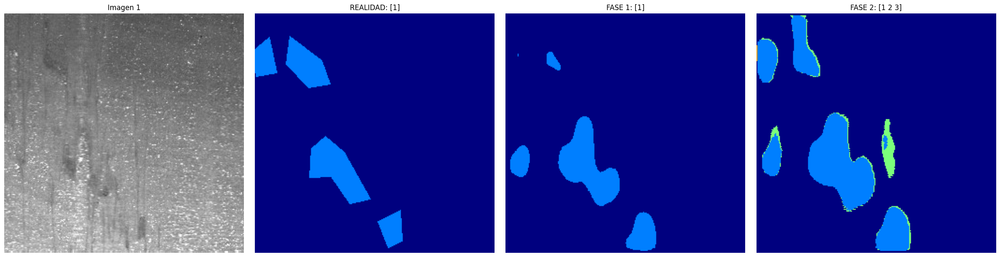

In [59]:
import matplotlib.pyplot as plt
import numpy as np
import torch
import segmentation_models_pytorch as smp

# ==========================================
# 🥊 BATALLA DE MODELOS: FASE 1 vs FASE 2
# ==========================================

# Configuración
DATASET_VALIDACION = val_ds_severstal  # <--- ¡AQUÍ ESTÁ LA CORRECCIÓN! Usamos tu variable real.
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
NUM_CLASSES = 5 # 0=Fondo + 4 defectos

def load_model_for_eval(path, num_classes, device):
    # Usamos UnetPlusPlus porque es lo que entrenaste
    model = smp.UnetPlusPlus(
        encoder_name='resnet34',
        encoder_weights=None,
        in_channels=3,
        classes=num_classes
    )
    # Carga segura: map_location evita errores si guardaste en una GPU distinta
    model.load_state_dict(torch.load(path, map_location=device))
    model.to(device)
    model.eval()
    return model

# 1. Cargar ambos luchadores
print("🔄 Cargando Modelos...")
try:
    # Modelo Fase 1 (Severstal Best)
    model_v1 = load_model_for_eval('severstal_best.pth', NUM_CLASSES, DEVICE)
    print("✅ Modelo Fase 1 (Conservador) cargado.")

    # Modelo Fase 2 (Severstal Final o Best Phase 2)
    # Intentamos cargar el 'final' primero, si no, el 'best_phase2'
    try:
        model_v2 = load_model_for_eval('severstal_phase2_final.pth', NUM_CLASSES, DEVICE)
        print("✅ Modelo Fase 2 (Final) cargado.")
    except:
        model_v2 = load_model_for_eval('severstal_best_phase2.pth', NUM_CLASSES, DEVICE)
        print("✅ Modelo Fase 2 (Best Phase 2) cargado.")

except Exception as e:
    print(f"❌ Error cargando modelos: {e}")
    print("Asegúrate de que los archivos .pth existen en la carpeta.")

# 2. Función de visualización
def compare_predictions(model1, model2, dataset, index, device):
    image, mask = dataset[index]
    image_tensor = image.unsqueeze(0).to(device)

    with torch.no_grad():
        out1 = model1(image_tensor)
        pred1 = torch.argmax(out1, dim=1).squeeze(0).cpu().numpy()

        out2 = model2(image_tensor)
        pred2 = torch.argmax(out2, dim=1).squeeze(0).cpu().numpy()

    # Des-normalizar imagen para visualizar
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    img_display = image.cpu().numpy().transpose(1, 2, 0)
    img_display = std * img_display + mean
    img_display = np.clip(img_display, 0, 1)

    true_mask = mask.cpu().numpy()

    # Plot
    fig, axes = plt.subplots(1, 4, figsize=(24, 6))
    cmap = plt.get_cmap('jet', 5) # Mapa de colores

    # Imagen Original
    axes[0].imshow(img_display)
    axes[0].set_title(f"Imagen {index}")
    axes[0].axis('off')

    # Realidad
    axes[1].imshow(true_mask, cmap=cmap, vmin=0, vmax=4)
    clases_real = np.unique(true_mask[true_mask!=0])
    axes[1].set_title(f"REALIDAD: {clases_real}")
    axes[1].axis('off')

    # Predicción Fase 1
    axes[2].imshow(pred1, cmap=cmap, vmin=0, vmax=4)
    clases_f1 = np.unique(pred1[pred1!=0])
    axes[2].set_title(f"FASE 1: {clases_f1}")
    axes[2].axis('off')

    # Predicción Fase 2
    axes[3].imshow(pred2, cmap=cmap, vmin=0, vmax=4)
    clases_f2 = np.unique(pred2[pred2!=0])
    axes[3].set_title(f"FASE 2: {clases_f2}")
    axes[3].axis('off')

    plt.tight_layout()
    plt.show()

# 3. Buscar ejemplos (Prioridad Clase 2)
print("\n🔎 Buscando ejemplos interesantes...")
indices_to_show = []
count_cls2 = 0
limit = min(len(DATASET_VALIDACION), 3000) # Escaneamos hasta 3000 imgs

for i in range(limit):
    _, m = DATASET_VALIDACION[i]
    if 2 in m: # Si tiene Clase 2 (la difícil)
        indices_to_show.append(i)
        count_cls2 += 1
    if count_cls2 >= 4: break # Queremos ver 4 de estas

# Si faltan, rellenamos con otros defectos
if len(indices_to_show) < 5:
    for i in range(limit):
        if i not in indices_to_show:
            _, m = DATASET_VALIDACION[i]
            if m.max() > 0: # Cualquier defecto
                indices_to_show.append(i)
                if len(indices_to_show) >= 5: break

if len(indices_to_show) > 0:
    for idx in indices_to_show:
        compare_predictions(model_v1, model_v2, DATASET_VALIDACION, idx, DEVICE)
else:
    print("⚠️ No encontré imágenes con defectos en el rango escaneado.")

✨ Probando TTA con umbrales bajos...


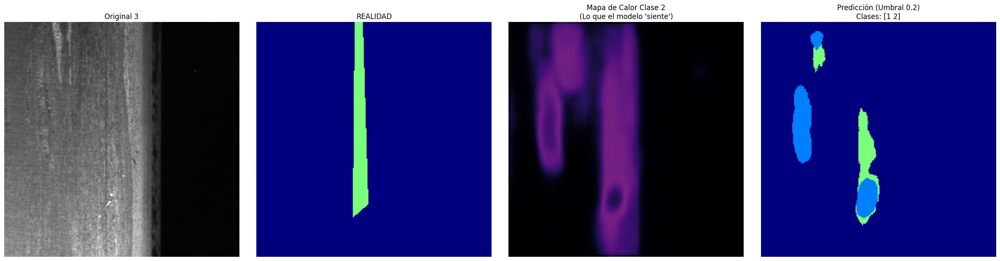

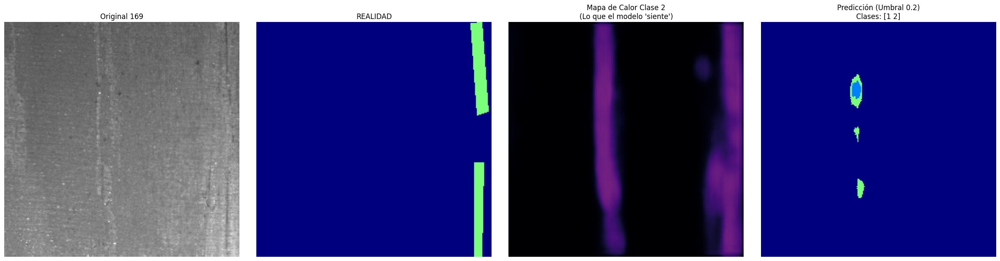

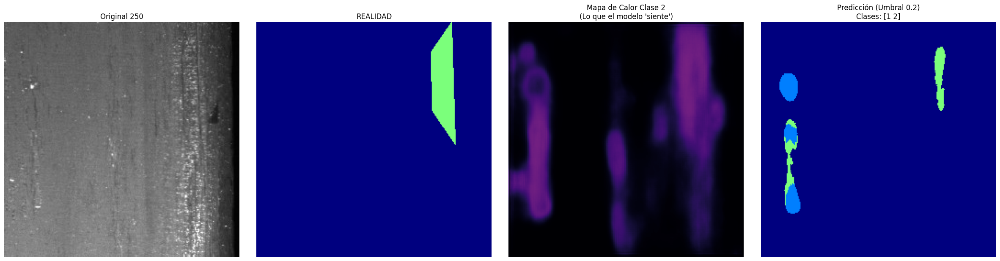

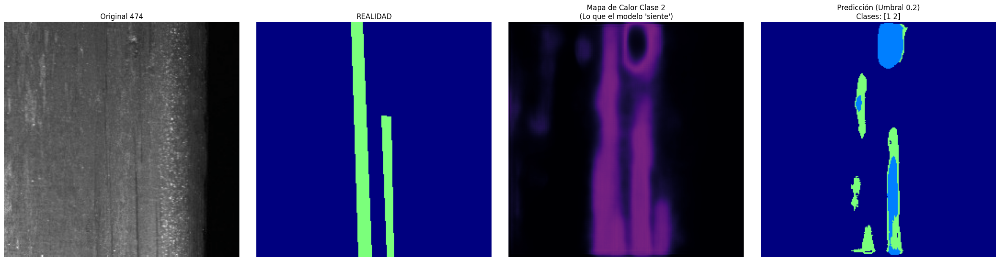

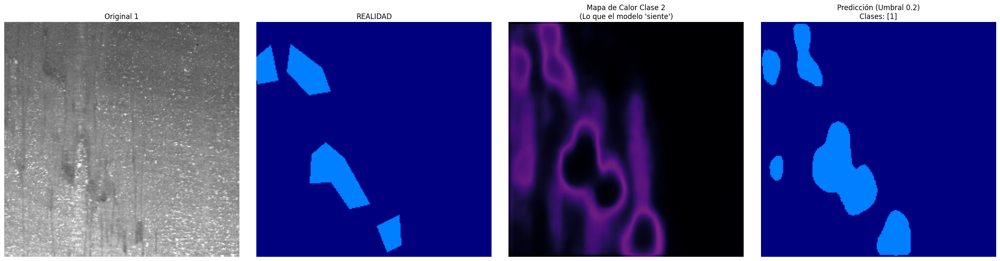

✨ Aplicando limpieza mágica (TTA)...


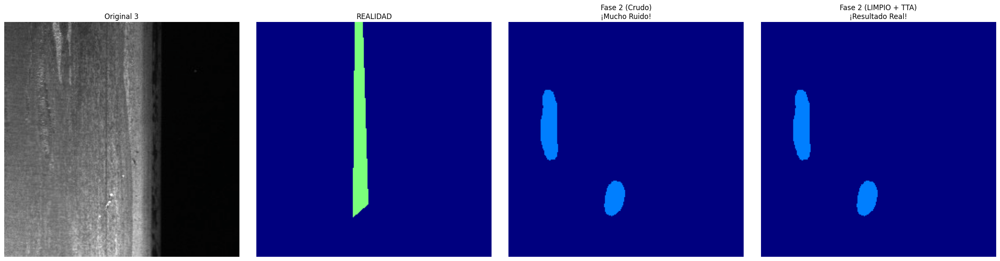

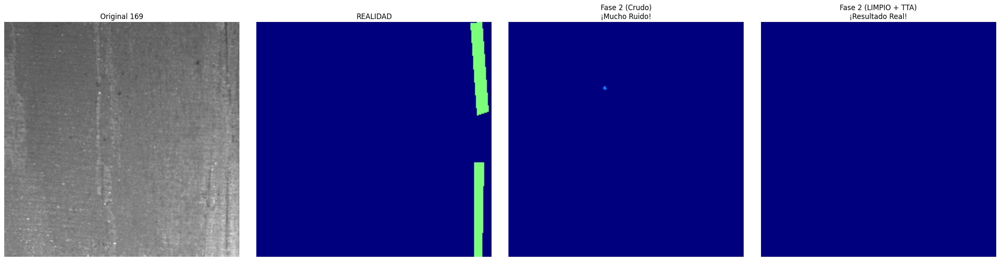

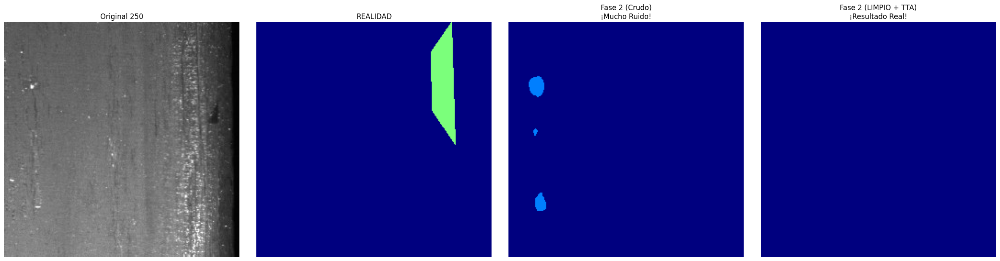

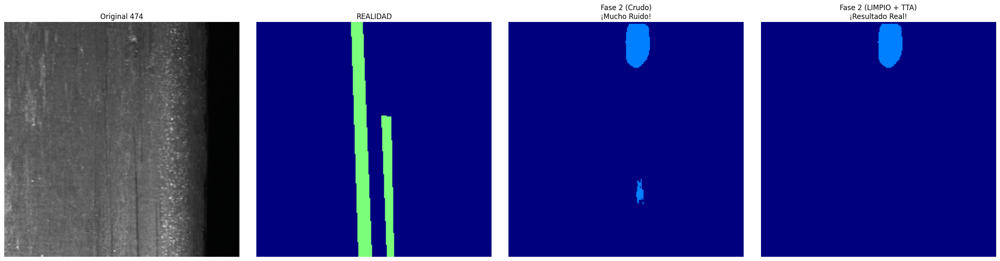

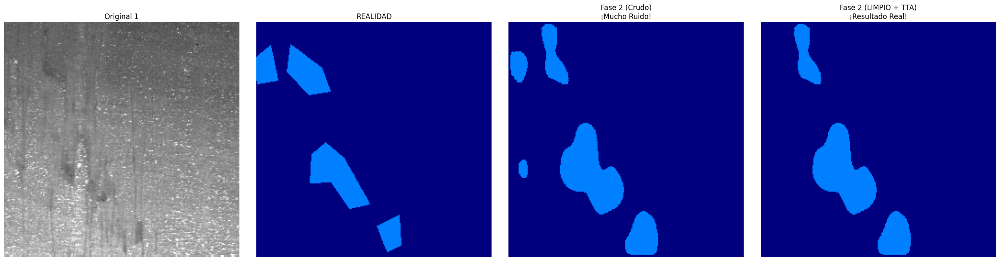

In [62]:
import torch.nn.functional as F

# ==========================================
# 🧼 LIMPIEZA FINAL: TTA + POST-PROCESADO
# ==========================================

def tta_prediction(model, image_tensor):
    # 1. Predicción Normal
    logits = model(image_tensor)
    probs = F.softmax(logits, dim=1)

    # 2. Predicción Flip Horizontal (Espejo)
    img_flip = torch.flip(image_tensor, dims=[3])
    logits_flip = model(img_flip)
    probs_flip = F.softmax(logits_flip, dim=1)
    probs_flip = torch.flip(probs_flip, dims=[3]) # Des-hacemos el flip

    # 3. Predicción Flip Vertical
    img_vflip = torch.flip(image_tensor, dims=[2])
    logits_vflip = model(img_vflip)
    probs_vflip = F.softmax(logits_vflip, dim=1)
    probs_vflip = torch.flip(probs_vflip, dims=[2])

    # PROMEDIO DE LAS 3 (Suaviza el ruido)
    avg_probs = (probs + probs_flip + probs_vflip) / 3.0
    return avg_probs

def clean_mask(mask_numpy, min_size=500):
    """Elimina manchitas pequeñas (ruido)"""
    from skimage import morphology

    clean_output = np.zeros_like(mask_numpy)
    for class_id in [1, 2, 3, 4]:
        # Separamos cada clase
        binary_class_mask = (mask_numpy == class_id)

        # Eliminamos objetos pequeños (manchas de ruido)
        cleaned = morphology.remove_small_objects(binary_class_mask, min_size=min_size)

        # Lo añadimos a la máscara final
        clean_output[cleaned] = class_id

    return clean_output

# ==========================================
# 🧪 TTA SUAVE (Para rescatar detecciones débiles)
# ==========================================

def visualize_soft_result(model, dataset, index, device):
    image, mask = dataset[index]
    image_tensor = image.unsqueeze(0).to(device)

    with torch.no_grad():
        # 1. TTA (Promedio de vistas)
        probs = tta_prediction(model, image_tensor)

        # 2. Umbral MUY BAJO (Rescatamos todo lo > 20%)
        prob_max, preds = torch.max(probs, dim=1)
        preds[prob_max < 0.20] = 0  # <--- CAMBIO CLAVE: Antes era 0.40

        pred_raw = preds.squeeze(0).cpu().numpy()

        # 3. Limpieza SUAVE (Solo borramos ruido muy pequeño)
        # Los defectos de clase 2 son finos, si pones 600 los borras.
        pred_clean = clean_mask(pred_raw, min_size=50) # <--- CAMBIO CLAVE: Antes era 600

    # Preparar visualización
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    img_display = image.cpu().numpy().transpose(1, 2, 0)
    img_display = std * img_display + mean
    img_display = np.clip(img_display, 0, 1)
    true_mask = mask.cpu().numpy()

    # GRAFICAR
    fig, axes = plt.subplots(1, 4, figsize=(24, 6))
    cmap = plt.get_cmap('jet', 5)

    axes[0].imshow(img_display)
    axes[0].set_title(f"Original {index}")
    axes[0].axis('off')

    axes[1].imshow(true_mask, cmap=cmap, vmin=0, vmax=4)
    axes[1].set_title(f"REALIDAD")
    axes[1].axis('off')

    # Aquí mostramos la probabilidad pura de la clase 2 para ver si la está viendo
    # Sacamos el mapa de calor de la Clase 2
    heatmap_cls2 = probs[0, 2, :, :].cpu().numpy()
    axes[2].imshow(heatmap_cls2, cmap='magma', vmin=0, vmax=1)
    axes[2].set_title(f"Mapa de Calor Clase 2\n(Lo que el modelo 'siente')")
    axes[2].axis('off')

    # Resultado Final Suave
    axes[3].imshow(pred_clean, cmap=cmap, vmin=0, vmax=4)
    clases = np.unique(pred_clean[pred_clean!=0])
    axes[3].set_title(f"Predicción (Umbral 0.2)\nClases: {clases}")
    axes[3].axis('off')

    plt.tight_layout()
    plt.show()

print("✨ Probando TTA con umbrales bajos...")
for idx in indices_to_show:
    visualize_soft_result(model_v2, val_ds_severstal, idx, DEVICE)

# Probamos con las mismas imágenes difíciles de antes
print("✨ Aplicando limpieza mágica (TTA)...")
for idx in indices_to_show:
    visualize_clean_result(model_v2, val_ds_severstal, idx, DEVICE)

🚀 Aplicando corrección de 'Confusión Azul/Verde'...


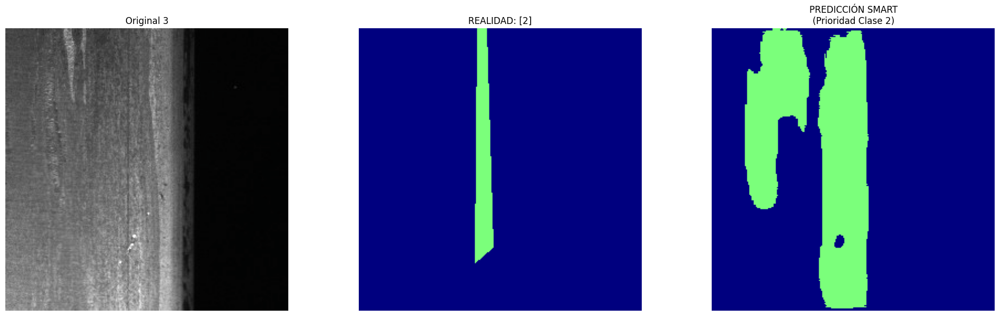

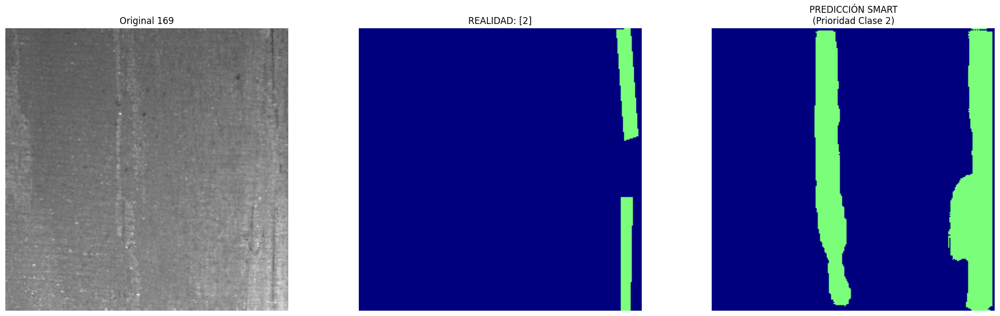

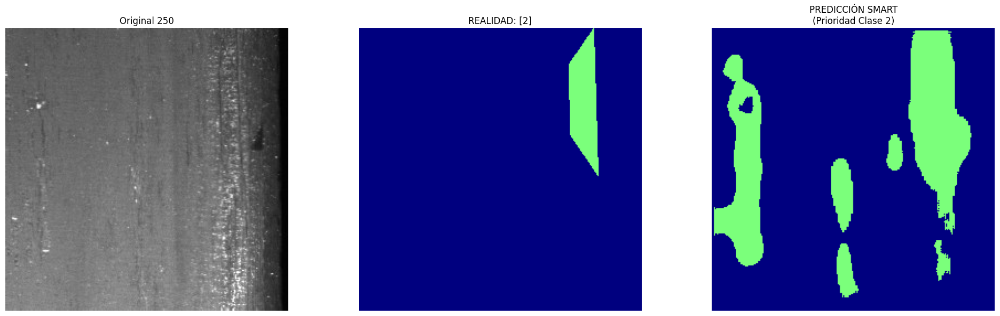

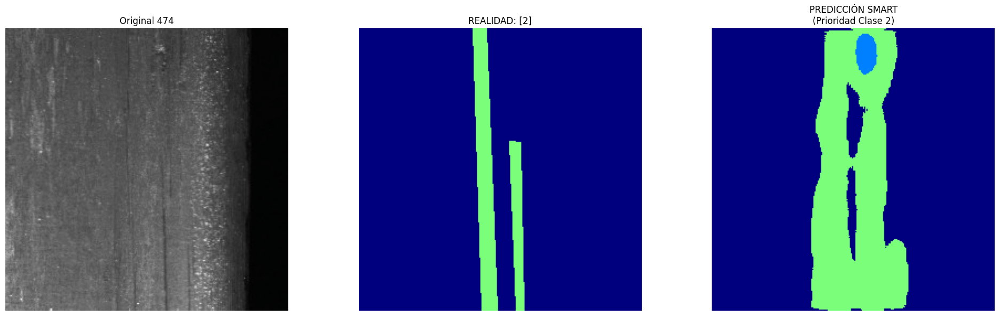

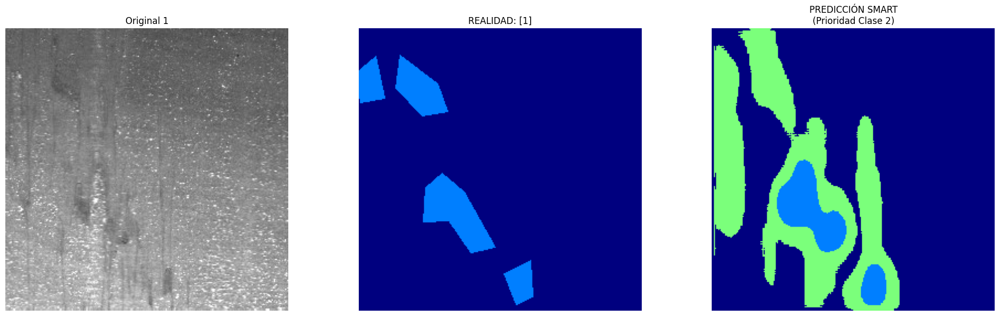

In [63]:
# ==========================================
# 🧠 SOLUCIÓN FINAL: PRIORIDAD DE CLASES
# ==========================================

def smart_inference(model, image_tensor):
    # 1. Obtenemos probabilidades con TTA
    probs = tta_prediction(model, image_tensor) # Forma: (1, 5, H, W)

    # 2. Separamos los canales de probabilidad
    prob_fondo = probs[0, 0, :, :]
    prob_cls1  = probs[0, 1, :, :]
    prob_cls2  = probs[0, 2, :, :] # <--- La clase difícil
    prob_cls3  = probs[0, 3, :, :]
    prob_cls4  = probs[0, 4, :, :]

    # 3. Creamos la máscara vacía
    final_mask = torch.zeros_like(prob_fondo)

    # 4. LÓGICA DE PRIORIDAD (Aquí está la magia)
    # Primero asignamos las clases fáciles (3 y 4) con umbral estándar (0.5)
    final_mask[prob_cls3 > 0.5] = 3
    final_mask[prob_cls4 > 0.5] = 4

    # AHORA EL TRUCO:
    # Si la Clase 2 tiene > 0.15 (muy bajo), la forzamos.
    # Esto "sobreescribe" a la Clase 1 si hay conflicto.
    mask_cls2 = (prob_cls2 > 0.15)
    final_mask[mask_cls2] = 2

    # La Clase 1 solo la pintamos si es muy segura (>0.5) Y NO hay clase 2
    mask_cls1 = (prob_cls1 > 0.5) & (~mask_cls2)
    final_mask[mask_cls1] = 1

    return final_mask.cpu().numpy()

# --- VISUALIZACIÓN FINAL ---
def visualize_smart_result(model, dataset, index, device):
    image, mask = dataset[index]
    image_tensor = image.unsqueeze(0).to(device)

    with torch.no_grad():
        # Usamos la inferencia inteligente
        pred_smart = smart_inference(model, image_tensor)
        # Limpieza final de ruido pequeño
        pred_clean = clean_mask(pred_smart, min_size=200)

    # Gráficos
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    img_display = image.cpu().numpy().transpose(1, 2, 0)
    img_display = std * img_display + mean
    img_display = np.clip(img_display, 0, 1)
    true_mask = mask.cpu().numpy()

    fig, axes = plt.subplots(1, 3, figsize=(20, 6))
    cmap = plt.get_cmap('jet', 5)

    axes[0].imshow(img_display)
    axes[0].set_title(f"Original {index}")
    axes[0].axis('off')

    axes[1].imshow(true_mask, cmap=cmap, vmin=0, vmax=4)
    axes[1].set_title(f"REALIDAD: {np.unique(true_mask[true_mask!=0])}")
    axes[1].axis('off')

    axes[2].imshow(pred_clean, cmap=cmap, vmin=0, vmax=4)
    axes[2].set_title(f"PREDICCIÓN SMART\n(Prioridad Clase 2)")
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()

print("🚀 Aplicando corrección de 'Confusión Azul/Verde'...")
for idx in indices_to_show:
    visualize_smart_result(model_v2, val_ds_severstal, idx, DEVICE)

In [64]:
import torch
import numpy as np
from tqdm import tqdm
from sklearn.metrics import f1_score # F1 es equivalente a Dice Coefficient

# ==========================================
# 1. EXTRACCIÓN DE PROBABILIDADES (CACHE)
# ==========================================
def get_all_predictions(model, loader, device):
    """
    Ejecuta el modelo sobre todo el valid set y guarda
    las probabilidades y las máscaras reales en la RAM (CPU)
    para poder probar umbrales rápidamente.
    """
    model.eval()
    all_probs = []
    all_masks = []

    print("📥 Procesando validación para extraer probabilidades...")
    with torch.no_grad():
        for images, masks in tqdm(loader, desc="Inferencia"):
            images = images.to(device)

            # Usamos TTA simple (Flip horizontal) para mejor calidad base
            # Si tarda mucho, quita las líneas de flip y usa solo model(images)
            out1 = model(images)
            out2 = model(torch.flip(images, dims=[3]))
            out2 = torch.flip(out2, dims=[3])
            probs = (torch.sigmoid(out1) + torch.sigmoid(out2)) / 2.0

            # Guardamos en CPU para no saturar la GPU
            all_probs.append(probs.cpu().numpy())
            all_masks.append(masks.numpy())

    return np.concatenate(all_probs), np.concatenate(all_masks)

# Ejecutamos la extracción (Esto tardará un par de minutos)
# Usamos el loader de validación que ya tienes
y_pred_prob, y_true = get_all_predictions(model_v2, val_loader_phase1, DEVICE)

print(f"✅ Datos extraídos. Shape Preds: {y_pred_prob.shape}, Shape Masks: {y_true.shape}")

# ==========================================
# 2. BÚSQUEDA DE UMBRALES (GRID SEARCH)
# ==========================================

def search_best_threshold_per_class(probs, targets, class_id, start=0.1, end=0.9, step=0.05):
    """
    Prueba umbrales desde 'start' a 'end' para una clase específica
    y devuelve el que tenga mejor Dice Score.
    """
    best_th = 0.5
    best_dice = -1.0

    # Aplanamos los arrays para esa clase (para hacerlo rápido con sklearn)
    # Seleccionamos solo el canal de la clase actual
    # Usamos [-1] para aplanar todo a una lista larga de 1s y 0s
    y_true_cls = (targets == class_id).astype(np.uint8).reshape(-1)
    probs_cls = probs[:, class_id, :, :].reshape(-1)

    # Barrido de umbrales
    thresholds = np.arange(start, end + step, step)

    print(f"\n🔎 Optimizando Clase {class_id}...")

    for th in thresholds:
        # Convertimos prob a 0 o 1 según el umbral actual
        pred_cls = (probs_cls > th).astype(np.uint8)

        # Calculamos Dice (F1 Score)
        # zero_division=1 evita errores si está vacío
        score = f1_score(y_true_cls, pred_cls, zero_division=1)

        if score > best_dice:
            best_dice = score
            best_th = th

        # (Opcional) Print para ver progreso
        # print(f"   Th: {th:.2f} -> Dice: {score:.4f}")

    print(f"🏆 MEJOR UMBRAL Clase {class_id}: {best_th:.2f} (Dice: {best_dice:.4f})")
    return best_th

# --- EJECUTAR OPTIMIZACIÓN ---
print("\n" + "="*40)
print("🤖 INICIANDO AJUSTE DE UMBRALES")
print("="*40)

best_thresholds = {}

# Ignoramos la Clase 0 (Fondo), optimizamos las defectos (1, 2, 3, 4)
for cls in [1, 2, 3, 4]:
    th = search_best_threshold_per_class(y_pred_prob, y_true, cls)
    best_thresholds[cls] = th

print("\n" + "="*40)
print("✨ RESULTADOS FINALES RECOMENDADOS")
print("="*40)
print(f"Clase 1 (Azul)    : {best_thresholds[1]:.2f}")
print(f"Clase 2 (Verde)   : {best_thresholds[2]:.2f} <--- ¡Fíjate en este!")
print(f"Clase 3 (Naranja) : {best_thresholds[3]:.2f}")
print(f"Clase 4 (Amarillo): {best_thresholds[4]:.2f}")

📥 Procesando validación para extraer probabilidades...


Inferencia: 100%|██████████| 63/63 [00:05<00:00, 10.59it/s]


✅ Datos extraídos. Shape Preds: (1000, 5, 256, 256), Shape Masks: (1000, 256, 256)

🤖 INICIANDO AJUSTE DE UMBRALES

🔎 Optimizando Clase 1...
🏆 MEJOR UMBRAL Clase 1: 0.75 (Dice: 0.6012)

🔎 Optimizando Clase 2...
🏆 MEJOR UMBRAL Clase 2: 0.40 (Dice: 0.1309)

🔎 Optimizando Clase 3...
🏆 MEJOR UMBRAL Clase 3: 0.70 (Dice: 0.7556)

🔎 Optimizando Clase 4...
🏆 MEJOR UMBRAL Clase 4: 0.80 (Dice: 0.8067)

✨ RESULTADOS FINALES RECOMENDADOS
Clase 1 (Azul)    : 0.75
Clase 2 (Verde)   : 0.40 <--- ¡Fíjate en este!
Clase 3 (Naranja) : 0.70
Clase 4 (Amarillo): 0.80


In [65]:
import torch
import numpy as np
from tqdm import tqdm

# ==========================================
# 🎓 EVALUACIÓN FINAL DE RENDIMIENTO
# ==========================================

# 1. PON AQUÍ TUS "NÚMEROS MÁGICOS" (Los que salieron del buscador)
OPTIMAL_THRESHOLDS = {
    1: 0.75, # Azul (Suele ser alto)
    2: 0.40, # Verde (EL IMPORTANTE: Suele ser bajo)
    3: 0.70, # Naranja
    4: 0.80  # Amarillo
}

def compute_iou_batch(preds, labels, classes=[1, 2, 3, 4]):
    """Calcula el IoU para un batch de imágenes y máscaras"""
    ious = []
    # Aplanamos para calcular rápido (Batch*H*W)
    preds = preds.reshape(-1)
    labels = labels.reshape(-1)

    for cls in classes:
        pred_inds = (preds == cls)
        target_inds = (labels == cls)

        intersection = (pred_inds & target_inds).sum()
        union = pred_inds.sum() + target_inds.sum() - intersection

        if union == 0:
            # Si no había nada y no predijo nada = 1.0 (Acierto)
            # Si no había nada y predijo algo = 0.0 (Error) - gestionado por intersection
            # Normalmente en segmentación, si union=0 se suele ignorar o dar 1 si intersection tb es 0.
            # Aquí usaremos la convención de smp: nan si no existe la clase en el batch
            ious.append(np.nan)
        else:
            ious.append(float(intersection) / float(max(union, 1)))

    return ious

def evaluate_model_performance(model, loader, thresholds, device):
    model.eval()

    # Acumuladores
    total_ious = {1: [], 2: [], 3: [], 4: []}

    print(f"🚀 Iniciando evaluación con umbrales: {thresholds}")

    with torch.no_grad():
        for images, masks in tqdm(loader, desc="Examinando"):
            images = images.to(device)
            masks = masks.numpy() # CPU para métricas

            # --- 1. INFERENCIA INTELIGENTE ---
            # Copiamos la lógica de 'inference_with_tuning' aquí para procesar el batch

            # A. TTA (Flip Horizontal)
            out1 = model(images)
            out2 = model(torch.flip(images, dims=[3]))
            out2 = torch.flip(out2, dims=[3])
            probs = (torch.sigmoid(out1) + torch.sigmoid(out2)) / 2.0

            # B. Separar canales
            prob_cls1 = probs[:, 1, :, :]
            prob_cls2 = probs[:, 2, :, :]
            prob_cls3 = probs[:, 3, :, :]
            prob_cls4 = probs[:, 4, :, :]

            # C. Aplicar Umbrales
            m1 = prob_cls1 > thresholds[1]
            m2 = prob_cls2 > thresholds[2] # El truco de la clase 2
            m3 = prob_cls3 > thresholds[3]
            m4 = prob_cls4 > thresholds[4]

            # D. Prioridad de Clases (Construir máscara final)
            pred_mask = torch.zeros_like(prob_cls1, dtype=torch.uint8)

            # Fáciles
            pred_mask[m3] = 3
            pred_mask[m4] = 4
            # Difíciles (Clase 2 gana a Clase 1)
            pred_mask[m2] = 2
            pred_mask[m1 & (~m2)] = 1

            pred_mask = pred_mask.cpu().numpy()

            # --- 2. CALCULAR MÉTRICAS ---
            # Iteramos por cada imagen del batch para ser precisos
            for i in range(len(images)):
                p = pred_mask[i]
                t = masks[i]

                # Calcular IoU por clase para esta imagen
                for cls in [1, 2, 3, 4]:
                    p_c = (p == cls)
                    t_c = (t == cls)

                    inter = np.logical_and(p_c, t_c).sum()
                    union = np.logical_or(p_c, t_c).sum()

                    if union > 0:
                        total_ious[cls].append(inter / union)
                    # Si union es 0 (no hay defecto ni real ni predicho),
                    # no sumamos nada a la lista (no afecta al promedio)

    # --- 3. REPORTE FINAL ---
    print("\n" + "="*40)
    print("🏆 RESULTADOS FINALES (SMART INFERENCE)")
    print("="*40)

    mean_ious = []
    for cls in [1, 2, 3, 4]:
        if len(total_ious[cls]) > 0:
            score = np.mean(total_ious[cls])
            mean_ious.append(score)
            print(f"✅ Clase {cls}: {score:.4f}")
        else:
            print(f"⚠️ Clase {cls}: No hay datos suficientes")

    global_iou = np.mean(mean_ious)
    print("-" * 40)
    print(f"🌟 MEAN IOU GLOBAL: {global_iou:.4f}")
    print("="*40)

# Ejecutar examen
evaluate_model_performance(model_v2, val_loader_phase1, OPTIMAL_THRESHOLDS, DEVICE)

🚀 Iniciando evaluación con umbrales: {1: 0.75, 2: 0.4, 3: 0.7, 4: 0.8}


Examinando: 100%|██████████| 63/63 [00:05<00:00, 10.88it/s]


🏆 RESULTADOS FINALES (SMART INFERENCE)
✅ Clase 1: 0.3406
✅ Clase 2: 0.0206
✅ Clase 3: 0.4873
✅ Clase 4: 0.5349
----------------------------------------
🌟 MEAN IOU GLOBAL: 0.3458


# Entreno con EfficientNet-B4

In [67]:
import torch
import torch.nn as nn
import torch.optim as optim
import segmentation_models_pytorch as smp
from torch.utils.data import DataLoader
from torch.cuda.amp import GradScaler

# ==========================================
# 🚀 FASE 3: LA BESTIA (EfficientNet-B4)
# ==========================================
print("\n" + "="*60)
print("🦾 INICIANDO FASE 3: UNET++ CON EFFICIENTNET-B4")
print("="*60 + "\n")

# 1. DEFINIR EL MODELO SOTA
# Unet++ maneja mejor las escalas distintas de defectos
# EfficientNet-B4 ve texturas que ResNet no ve
model_heavy = smp.UnetPlusPlus(
    encoder_name='efficientnet-b4',
    encoder_weights='imagenet',
    in_channels=3,
    classes=5  # 0=Fondo, 1,2,3,4=Defectos
)
model_heavy.to(DEVICE)

# 2. AJUSTAR DATA LOADERS (Por memoria VRAM)
# EfficientNet es pesado. Bajamos batch size para no saturar la GPU.
# Si tienes una A100 puedes probar con 8 o 16. Si da error de memoria, baja a 4.
BATCH_SIZE_HEAVY = 8

train_loader_heavy = DataLoader(train_ds_severstal, batch_size=BATCH_SIZE_HEAVY, shuffle=True, num_workers=4, pin_memory=True)
val_loader_heavy = DataLoader(val_ds_severstal, batch_size=BATCH_SIZE_HEAVY, shuffle=False, num_workers=4, pin_memory=True)

# 3. LOSS AVANZADA (Tu estrategia ganadora)
# Mantenemos los pesos agresivos para castigar fallos en Clase 2
class_weights = torch.tensor([0.1, 2.0, 10.0, 2.0, 2.0]).to(DEVICE)

ce_weighted = nn.CrossEntropyLoss(weight=class_weights)
dice_loss_fn = smp.losses.DiceLoss(mode='multiclass', from_logits=True)
focal_loss_fn = smp.losses.FocalLoss(mode='multiclass')

def criterion_heavy(preds, targets):
    # La misma fórmula mágica de la Fase 2
    return (0.4 * ce_weighted(preds, targets) +
            0.3 * dice_loss_fn(preds, targets) +
            0.3 * focal_loss_fn(preds, targets))

# 4. OPTIMIZADOR Y SCHEDULER
# Empezamos con LR un poco más alto (1e-4) porque la red es "nueva" en este dataset
optimizer_heavy = torch.optim.AdamW(model_heavy.parameters(), lr=1e-4, weight_decay=1e-3)

# Cosine Annealing para ciclos de aprendizaje
scheduler_heavy = optim.lr_scheduler.CosineAnnealingWarmRestarts(
    optimizer_heavy, T_0=10, T_mult=2, eta_min=1e-6
)

# Scaler para Mixed Precision (Vital para EfficientNet)
scaler = torch.amp.GradScaler('cuda')

# 5. BUCLE DE ENTRENAMIENTO
HEAVY_EPOCHS = 35 # Le damos tiempo para converger
best_iou_heavy = 0.0

print(f"⚙️ Configuración lista. Arquitectura: Unet++ (EffNet-B4). Batch: {BATCH_SIZE_HEAVY}")

for epoch in range(HEAVY_EPOCHS):
    print(f"\nEpoch {epoch+1}/{HEAVY_EPOCHS} (Modelo Heavy)")
    print("-" * 60)

    # Train
    train_loss, train_iou, train_ious = train_one_epoch(
        model_heavy, train_loader_heavy, criterion_heavy,
        optimizer_heavy, scaler, DEVICE, 5
    )

    # Val
    val_loss, val_iou, val_ious = validate(
        model_heavy, val_loader_heavy, criterion_heavy, DEVICE, 5
    )

    # Scheduler paso a paso
    scheduler_heavy.step()
    current_lr = optimizer_heavy.param_groups[0]['lr']

    # Logs
    print(f"Train Loss: {train_loss:.4f} | Train IoU: {train_iou:.4f}")
    print(f"Val Loss: {val_loss:.4f} | Val IoU: {val_iou:.4f}")

    iou_str = [f'{x:.3f}' for x in val_ious] if isinstance(val_ious, (list, np.ndarray)) else f"{val_ious:.3f}"
    print(f"Val IoUs: {iou_str}")
    print(f"LR: {current_lr:.7f}")

    # Guardar Mejor Modelo (Usamos nombre nuevo para no pisar el anterior)
    if val_iou > best_iou_heavy:
        best_iou_heavy = val_iou
        torch.save(model_heavy.state_dict(), 'severstal_effb4_best.pth')
        print(f"🔥 ¡NUEVO RÉCORD HEAVY! IoU: {best_iou_heavy:.4f}")

print(f"\n{'='*60}")
print(f"🏆 ENTRENAMIENTO HEAVY FINALIZADO - Mejor IoU: {best_iou_heavy:.4f}")


🦾 INICIANDO FASE 3: UNET++ CON EFFICIENTNET-B4

⚙️ Configuración lista. Arquitectura: Unet++ (EffNet-B4). Batch: 8

Epoch 1/35 (Modelo Heavy)
------------------------------------------------------------


Training (AMP):   0%|          | 0/709 [00:00<?, ?it/s]/tmp/ipython-input-1131897335.py:58: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=True):
Validation: 100%|██████████| 125/125 [00:06<00:00, 20.17it/s]


Train Loss: 0.5576 | Train IoU: 0.2180
Val Loss: 0.3151 | Val IoU: 0.2791
Val IoUs: ['0.908', '0.000', '0.000', '0.359', '0.129']
LR: 0.0000976
🔥 ¡NUEVO RÉCORD HEAVY! IoU: 0.2791

Epoch 2/35 (Modelo Heavy)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:06<00:00, 20.80it/s]


Train Loss: 0.3485 | Train IoU: 0.2679
Val Loss: 0.2615 | Val IoU: 0.3057
Val IoUs: ['0.915', '0.000', '0.000', '0.399', '0.215']
LR: 0.0000905
🔥 ¡NUEVO RÉCORD HEAVY! IoU: 0.3057

Epoch 3/35 (Modelo Heavy)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:05<00:00, 21.57it/s]


Train Loss: 0.3283 | Train IoU: 0.2732
Val Loss: 0.2394 | Val IoU: 0.3132
Val IoUs: ['0.928', '0.010', '0.000', '0.430', '0.198']
LR: 0.0000796
🔥 ¡NUEVO RÉCORD HEAVY! IoU: 0.3132

Epoch 4/35 (Modelo Heavy)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:05<00:00, 21.28it/s]


Train Loss: 0.3046 | Train IoU: 0.2848
Val Loss: 0.2187 | Val IoU: 0.3218
Val IoUs: ['0.914', '0.013', '0.000', '0.395', '0.286']
LR: 0.0000658
🔥 ¡NUEVO RÉCORD HEAVY! IoU: 0.3218

Epoch 5/35 (Modelo Heavy)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:05<00:00, 20.84it/s]


Train Loss: 0.2879 | Train IoU: 0.2949
Val Loss: 0.2100 | Val IoU: 0.3579
Val IoUs: ['0.924', '0.083', '0.000', '0.433', '0.349']
LR: 0.0000505
🔥 ¡NUEVO RÉCORD HEAVY! IoU: 0.3579

Epoch 6/35 (Modelo Heavy)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:05<00:00, 21.29it/s]


Train Loss: 0.2790 | Train IoU: 0.2982
Val Loss: 0.2003 | Val IoU: 0.3796
Val IoUs: ['0.934', '0.105', '0.000', '0.450', '0.409']
LR: 0.0000352
🔥 ¡NUEVO RÉCORD HEAVY! IoU: 0.3796

Epoch 7/35 (Modelo Heavy)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:05<00:00, 21.17it/s]


Train Loss: 0.2675 | Train IoU: 0.3052
Val Loss: 0.1950 | Val IoU: 0.3723
Val IoUs: ['0.935', '0.114', '0.000', '0.463', '0.349']
LR: 0.0000214

Epoch 8/35 (Modelo Heavy)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:06<00:00, 20.48it/s]


Train Loss: 0.2630 | Train IoU: 0.3079
Val Loss: 0.1959 | Val IoU: 0.3585
Val IoUs: ['0.932', '0.128', '0.000', '0.472', '0.260']
LR: 0.0000105

Epoch 9/35 (Modelo Heavy)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:05<00:00, 20.88it/s]


Train Loss: 0.2472 | Train IoU: 0.3109
Val Loss: 0.1881 | Val IoU: 0.3854
Val IoUs: ['0.938', '0.126', '0.000', '0.471', '0.391']
LR: 0.0000034
🔥 ¡NUEVO RÉCORD HEAVY! IoU: 0.3854

Epoch 10/35 (Modelo Heavy)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:05<00:00, 20.88it/s]


Train Loss: 0.2598 | Train IoU: 0.3124
Val Loss: 0.1876 | Val IoU: 0.3629
Val IoUs: ['0.936', '0.112', '0.000', '0.475', '0.291']
LR: 0.0001000

Epoch 11/35 (Modelo Heavy)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:05<00:00, 21.31it/s]


Train Loss: 0.2682 | Train IoU: 0.3014
Val Loss: 0.1922 | Val IoU: 0.3498
Val IoUs: ['0.927', '0.106', '0.000', '0.453', '0.261']
LR: 0.0000994

Epoch 12/35 (Modelo Heavy)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:05<00:00, 21.33it/s]


Train Loss: 0.2690 | Train IoU: 0.3021
Val Loss: 0.2147 | Val IoU: 0.3567
Val IoUs: ['0.941', '0.132', '0.000', '0.471', '0.239']
LR: 0.0000976

Epoch 13/35 (Modelo Heavy)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:05<00:00, 21.20it/s]


Train Loss: 0.2654 | Train IoU: 0.3127
Val Loss: 0.1897 | Val IoU: 0.3650
Val IoUs: ['0.933', '0.103', '0.000', '0.458', '0.331']
LR: 0.0000946

Epoch 14/35 (Modelo Heavy)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:05<00:00, 21.01it/s]


Train Loss: 0.2539 | Train IoU: 0.3158
Val Loss: 0.1875 | Val IoU: 0.3788
Val IoUs: ['0.942', '0.144', '0.000', '0.493', '0.315']
LR: 0.0000905

Epoch 15/35 (Modelo Heavy)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:05<00:00, 21.22it/s]


Train Loss: 0.2585 | Train IoU: 0.3166
Val Loss: 0.1886 | Val IoU: 0.3862
Val IoUs: ['0.926', '0.168', '0.000', '0.428', '0.409']
LR: 0.0000855
🔥 ¡NUEVO RÉCORD HEAVY! IoU: 0.3862

Epoch 16/35 (Modelo Heavy)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:06<00:00, 20.55it/s]


Train Loss: 0.2523 | Train IoU: 0.3219
Val Loss: 0.1920 | Val IoU: 0.3824
Val IoUs: ['0.945', '0.099', '0.002', '0.512', '0.355']
LR: 0.0000796

Epoch 17/35 (Modelo Heavy)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:06<00:00, 20.66it/s]


Train Loss: 0.2342 | Train IoU: 0.3228
Val Loss: 0.1758 | Val IoU: 0.3860
Val IoUs: ['0.939', '0.126', '0.002', '0.475', '0.388']
LR: 0.0000730

Epoch 18/35 (Modelo Heavy)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:06<00:00, 20.49it/s]


Train Loss: 0.2391 | Train IoU: 0.3247
Val Loss: 0.1791 | Val IoU: 0.3740
Val IoUs: ['0.929', '0.144', '0.000', '0.446', '0.351']
LR: 0.0000658

Epoch 19/35 (Modelo Heavy)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:05<00:00, 20.91it/s]


Train Loss: 0.2336 | Train IoU: 0.3256
Val Loss: 0.1682 | Val IoU: 0.4078
Val IoUs: ['0.941', '0.148', '0.000', '0.480', '0.470']
LR: 0.0000582
🔥 ¡NUEVO RÉCORD HEAVY! IoU: 0.4078

Epoch 20/35 (Modelo Heavy)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:05<00:00, 21.04it/s]


Train Loss: 0.2288 | Train IoU: 0.3305
Val Loss: 0.1765 | Val IoU: 0.4053
Val IoUs: ['0.949', '0.128', '0.000', '0.512', '0.439']
LR: 0.0000505

Epoch 21/35 (Modelo Heavy)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:06<00:00, 20.13it/s]


Train Loss: 0.2221 | Train IoU: 0.3392
Val Loss: 0.1719 | Val IoU: 0.3740
Val IoUs: ['0.939', '0.105', '0.000', '0.483', '0.343']
LR: 0.0000428

Epoch 22/35 (Modelo Heavy)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:05<00:00, 21.55it/s]


Train Loss: 0.2204 | Train IoU: 0.3436
Val Loss: 0.1659 | Val IoU: 0.4102
Val IoUs: ['0.942', '0.198', '0.019', '0.491', '0.400']
LR: 0.0000352
🔥 ¡NUEVO RÉCORD HEAVY! IoU: 0.4102

Epoch 23/35 (Modelo Heavy)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:05<00:00, 21.64it/s]


Train Loss: 0.2089 | Train IoU: 0.3394
Val Loss: 0.1642 | Val IoU: 0.4149
Val IoUs: ['0.938', '0.183', '0.014', '0.483', '0.457']
LR: 0.0000280
🔥 ¡NUEVO RÉCORD HEAVY! IoU: 0.4149

Epoch 24/35 (Modelo Heavy)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:05<00:00, 20.88it/s]


Train Loss: 0.2098 | Train IoU: 0.3425
Val Loss: 0.1649 | Val IoU: 0.4116
Val IoUs: ['0.949', '0.181', '0.004', '0.527', '0.396']
LR: 0.0000214

Epoch 25/35 (Modelo Heavy)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:05<00:00, 20.87it/s]


Train Loss: 0.2072 | Train IoU: 0.3432
Val Loss: 0.1592 | Val IoU: 0.4289
Val IoUs: ['0.948', '0.198', '0.013', '0.520', '0.465']
LR: 0.0000155
🔥 ¡NUEVO RÉCORD HEAVY! IoU: 0.4289

Epoch 26/35 (Modelo Heavy)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:05<00:00, 21.12it/s]


Train Loss: 0.2025 | Train IoU: 0.3498
Val Loss: 0.1601 | Val IoU: 0.4183
Val IoUs: ['0.939', '0.220', '0.020', '0.488', '0.424']
LR: 0.0000105

Epoch 27/35 (Modelo Heavy)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:05<00:00, 20.85it/s]


Train Loss: 0.1983 | Train IoU: 0.3534
Val Loss: 0.1570 | Val IoU: 0.4174
Val IoUs: ['0.946', '0.211', '0.021', '0.522', '0.387']
LR: 0.0000064

Epoch 28/35 (Modelo Heavy)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:05<00:00, 21.52it/s]


Train Loss: 0.2083 | Train IoU: 0.3494
Val Loss: 0.1578 | Val IoU: 0.4220
Val IoUs: ['0.947', '0.200', '0.020', '0.516', '0.427']
LR: 0.0000034

Epoch 29/35 (Modelo Heavy)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:06<00:00, 20.66it/s]


Train Loss: 0.2027 | Train IoU: 0.3511
Val Loss: 0.1568 | Val IoU: 0.4256
Val IoUs: ['0.945', '0.193', '0.021', '0.510', '0.458']
LR: 0.0000016

Epoch 30/35 (Modelo Heavy)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:05<00:00, 21.71it/s]


Train Loss: 0.2056 | Train IoU: 0.3532
Val Loss: 0.1575 | Val IoU: 0.4267
Val IoUs: ['0.947', '0.206', '0.022', '0.515', '0.443']
LR: 0.0001000

Epoch 31/35 (Modelo Heavy)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:05<00:00, 21.48it/s]


Train Loss: 0.2192 | Train IoU: 0.3367
Val Loss: 0.1679 | Val IoU: 0.4203
Val IoUs: ['0.950', '0.172', '0.018', '0.525', '0.436']
LR: 0.0000998

Epoch 32/35 (Modelo Heavy)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:06<00:00, 20.45it/s]


Train Loss: 0.2288 | Train IoU: 0.3378
Val Loss: 0.1735 | Val IoU: 0.4106
Val IoUs: ['0.943', '0.241', '0.023', '0.474', '0.373']
LR: 0.0000994

Epoch 33/35 (Modelo Heavy)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:05<00:00, 20.91it/s]


Train Loss: 0.2185 | Train IoU: 0.3432
Val Loss: 0.1889 | Val IoU: 0.3997
Val IoUs: ['0.941', '0.114', '0.008', '0.490', '0.445']
LR: 0.0000986

Epoch 34/35 (Modelo Heavy)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:05<00:00, 21.25it/s]


Train Loss: 0.2257 | Train IoU: 0.3384
Val Loss: 0.1743 | Val IoU: 0.3610
Val IoUs: ['0.922', '0.127', '0.017', '0.440', '0.298']
LR: 0.0000976

Epoch 35/35 (Modelo Heavy)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:05<00:00, 20.92it/s]


Train Loss: 0.2210 | Train IoU: 0.3343
Val Loss: 0.1599 | Val IoU: 0.4339
Val IoUs: ['0.944', '0.211', '0.023', '0.502', '0.489']
LR: 0.0000962
🔥 ¡NUEVO RÉCORD HEAVY! IoU: 0.4339

🏆 ENTRENAMIENTO HEAVY FINALIZADO - Mejor IoU: 0.4339


In [68]:
# ==========================================
# ⏱️ PRÓRROGA: COMPLETAR EL CICLO 3 (Hasta Epoch 70)
# ==========================================
print("\n" + "="*60)
print("🚀 EXTENSIÓN DE ENTRENAMIENTO: OBJETIVO EPOCH 70")
print("="*60 + "\n")

# 1. Ajustamos el Scheduler para continuar correctamente
# Como el optimizador ya tiene el estado interno, solo necesitamos seguir iterando.
# Pero aumentamos el total de épocas.
EXTRA_EPOCHS = 35 # 35 (ya hechas) + 35 (nuevas) = 70 Total

for epoch in range(HEAVY_EPOCHS, HEAVY_EPOCHS + EXTRA_EPOCHS):
    print(f"\nEpoch {epoch+1}/{HEAVY_EPOCHS + EXTRA_EPOCHS} (Heavy Extension)")
    print("-" * 60)

    # Train
    train_loss, train_iou, train_ious = train_one_epoch(
        model_heavy, train_loader_heavy, criterion_heavy,
        optimizer_heavy, scaler, DEVICE, 5
    )

    # Val
    val_loss, val_iou, val_ious = validate(
        model_heavy, val_loader_heavy, criterion_heavy, DEVICE, 5
    )

    # Scheduler step
    scheduler_heavy.step()
    current_lr = optimizer_heavy.param_groups[0]['lr']

    # Logs
    print(f"Train Loss: {train_loss:.4f} | Train IoU: {train_iou:.4f}")
    print(f"Val Loss: {val_loss:.4f} | Val IoU: {val_iou:.4f}")

    iou_str = [f'{x:.3f}' for x in val_ious] if isinstance(val_ious, (list, np.ndarray)) else f"{val_ious:.3f}"
    print(f"Val IoUs: {iou_str}")
    print(f"LR: {current_lr:.7f}")

    # Guardar Mejor Modelo
    if val_iou > best_iou_heavy:
        best_iou_heavy = val_iou
        torch.save(model_heavy.state_dict(), 'severstal_effb4_best.pth')
        print(f"🔥 ¡NUEVO RÉCORD GLOBAL! IoU: {best_iou_heavy:.4f}")

print(f"\n{'='*60}")
print(f"🏆 ENTRENAMIENTO EXTENDIDO FINALIZADO - Mejor IoU: {best_iou_heavy:.4f}")


🚀 EXTENSIÓN DE ENTRENAMIENTO: OBJETIVO EPOCH 70


Epoch 36/70 (Heavy Extension)
------------------------------------------------------------


Training (AMP):   0%|          | 0/709 [00:00<?, ?it/s]/tmp/ipython-input-1131897335.py:58: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=True):
Validation: 100%|██████████| 125/125 [00:05<00:00, 21.49it/s]


Train Loss: 0.2187 | Train IoU: 0.3423
Val Loss: 0.1663 | Val IoU: 0.3981
Val IoUs: ['0.930', '0.204', '0.015', '0.457', '0.385']
LR: 0.0000946

Epoch 37/70 (Heavy Extension)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:05<00:00, 21.17it/s]


Train Loss: 0.2115 | Train IoU: 0.3412
Val Loss: 0.1575 | Val IoU: 0.4129
Val IoUs: ['0.943', '0.161', '0.031', '0.488', '0.443']
LR: 0.0000927

Epoch 38/70 (Heavy Extension)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:06<00:00, 20.49it/s]


Train Loss: 0.2184 | Train IoU: 0.3351
Val Loss: 0.1737 | Val IoU: 0.3811
Val IoUs: ['0.936', '0.131', '0.020', '0.476', '0.343']
LR: 0.0000905

Epoch 39/70 (Heavy Extension)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:05<00:00, 21.82it/s]


Train Loss: 0.2186 | Train IoU: 0.3408
Val Loss: 0.1650 | Val IoU: 0.3948
Val IoUs: ['0.941', '0.126', '0.018', '0.483', '0.405']
LR: 0.0000881

Epoch 40/70 (Heavy Extension)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:06<00:00, 20.37it/s]


Train Loss: 0.2068 | Train IoU: 0.3558
Val Loss: 0.1625 | Val IoU: 0.4232
Val IoUs: ['0.949', '0.170', '0.017', '0.516', '0.465']
LR: 0.0000855

Epoch 41/70 (Heavy Extension)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:05<00:00, 22.01it/s]


Train Loss: 0.2010 | Train IoU: 0.3567
Val Loss: 0.1594 | Val IoU: 0.4267
Val IoUs: ['0.950', '0.161', '0.055', '0.525', '0.442']
LR: 0.0000826

Epoch 42/70 (Heavy Extension)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:05<00:00, 21.46it/s]


Train Loss: 0.2010 | Train IoU: 0.3492
Val Loss: 0.1533 | Val IoU: 0.4383
Val IoUs: ['0.949', '0.199', '0.041', '0.504', '0.499']
LR: 0.0000796
🔥 ¡NUEVO RÉCORD GLOBAL! IoU: 0.4383

Epoch 43/70 (Heavy Extension)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:06<00:00, 20.50it/s]


Train Loss: 0.2098 | Train IoU: 0.3509
Val Loss: 0.1582 | Val IoU: 0.4192
Val IoUs: ['0.935', '0.164', '0.023', '0.459', '0.516']
LR: 0.0000764

Epoch 44/70 (Heavy Extension)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:06<00:00, 20.61it/s]


Train Loss: 0.2012 | Train IoU: 0.3589
Val Loss: 0.1616 | Val IoU: 0.4462
Val IoUs: ['0.949', '0.190', '0.060', '0.499', '0.533']
LR: 0.0000730
🔥 ¡NUEVO RÉCORD GLOBAL! IoU: 0.4462

Epoch 45/70 (Heavy Extension)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:05<00:00, 20.95it/s]


Train Loss: 0.2080 | Train IoU: 0.3572
Val Loss: 0.1505 | Val IoU: 0.4198
Val IoUs: ['0.939', '0.182', '0.031', '0.479', '0.468']
LR: 0.0000694

Epoch 46/70 (Heavy Extension)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:06<00:00, 20.78it/s]


Train Loss: 0.1985 | Train IoU: 0.3537
Val Loss: 0.1574 | Val IoU: 0.4354
Val IoUs: ['0.948', '0.221', '0.024', '0.496', '0.489']
LR: 0.0000658

Epoch 47/70 (Heavy Extension)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:05<00:00, 21.28it/s]


Train Loss: 0.1941 | Train IoU: 0.3643
Val Loss: 0.1604 | Val IoU: 0.4426
Val IoUs: ['0.949', '0.220', '0.033', '0.500', '0.511']
LR: 0.0000621

Epoch 48/70 (Heavy Extension)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:05<00:00, 21.17it/s]


Train Loss: 0.1872 | Train IoU: 0.3623
Val Loss: 0.1729 | Val IoU: 0.4529
Val IoUs: ['0.955', '0.227', '0.065', '0.533', '0.485']
LR: 0.0000582
🔥 ¡NUEVO RÉCORD GLOBAL! IoU: 0.4529

Epoch 49/70 (Heavy Extension)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:06<00:00, 20.65it/s]


Train Loss: 0.1953 | Train IoU: 0.3676
Val Loss: 0.1622 | Val IoU: 0.3956
Val IoUs: ['0.940', '0.134', '0.020', '0.488', '0.396']
LR: 0.0000544

Epoch 50/70 (Heavy Extension)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:05<00:00, 21.11it/s]


Train Loss: 0.1946 | Train IoU: 0.3677
Val Loss: 0.1572 | Val IoU: 0.4372
Val IoUs: ['0.946', '0.150', '0.051', '0.508', '0.530']
LR: 0.0000505

Epoch 51/70 (Heavy Extension)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:05<00:00, 21.62it/s]


Train Loss: 0.1899 | Train IoU: 0.3641
Val Loss: 0.1491 | Val IoU: 0.4470
Val IoUs: ['0.956', '0.180', '0.044', '0.551', '0.504']
LR: 0.0000466

Epoch 52/70 (Heavy Extension)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:06<00:00, 20.67it/s]


Train Loss: 0.1937 | Train IoU: 0.3653
Val Loss: 0.1497 | Val IoU: 0.4286
Val IoUs: ['0.945', '0.180', '0.029', '0.504', '0.486']
LR: 0.0000428

Epoch 53/70 (Heavy Extension)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:06<00:00, 20.74it/s]


Train Loss: 0.1851 | Train IoU: 0.3701
Val Loss: 0.1450 | Val IoU: 0.4358
Val IoUs: ['0.948', '0.195', '0.041', '0.519', '0.476']
LR: 0.0000389

Epoch 54/70 (Heavy Extension)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:05<00:00, 21.29it/s]


Train Loss: 0.1795 | Train IoU: 0.3701
Val Loss: 0.1435 | Val IoU: 0.4541
Val IoUs: ['0.952', '0.242', '0.071', '0.533', '0.472']
LR: 0.0000352
🔥 ¡NUEVO RÉCORD GLOBAL! IoU: 0.4541

Epoch 55/70 (Heavy Extension)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:06<00:00, 20.33it/s]


Train Loss: 0.1855 | Train IoU: 0.3741
Val Loss: 0.1479 | Val IoU: 0.4493
Val IoUs: ['0.956', '0.231', '0.025', '0.551', '0.483']
LR: 0.0000316

Epoch 56/70 (Heavy Extension)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:06<00:00, 20.47it/s]


Train Loss: 0.1805 | Train IoU: 0.3750
Val Loss: 0.1477 | Val IoU: 0.4418
Val IoUs: ['0.948', '0.194', '0.084', '0.520', '0.463']
LR: 0.0000280

Epoch 57/70 (Heavy Extension)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:05<00:00, 21.07it/s]


Train Loss: 0.1772 | Train IoU: 0.3794
Val Loss: 0.1451 | Val IoU: 0.4384
Val IoUs: ['0.948', '0.185', '0.045', '0.524', '0.489']
LR: 0.0000246

Epoch 58/70 (Heavy Extension)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:06<00:00, 20.31it/s]


Train Loss: 0.1802 | Train IoU: 0.3803
Val Loss: 0.1453 | Val IoU: 0.4552
Val IoUs: ['0.954', '0.224', '0.057', '0.535', '0.506']
LR: 0.0000214
🔥 ¡NUEVO RÉCORD GLOBAL! IoU: 0.4552

Epoch 59/70 (Heavy Extension)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:05<00:00, 21.29it/s]


Train Loss: 0.1758 | Train IoU: 0.3753
Val Loss: 0.1416 | Val IoU: 0.4371
Val IoUs: ['0.948', '0.195', '0.054', '0.520', '0.468']
LR: 0.0000184

Epoch 60/70 (Heavy Extension)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:05<00:00, 20.96it/s]


Train Loss: 0.1754 | Train IoU: 0.3837
Val Loss: 0.1436 | Val IoU: 0.4606
Val IoUs: ['0.954', '0.228', '0.068', '0.535', '0.518']
LR: 0.0000155
🔥 ¡NUEVO RÉCORD GLOBAL! IoU: 0.4606

Epoch 61/70 (Heavy Extension)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:05<00:00, 21.01it/s]


Train Loss: 0.1726 | Train IoU: 0.3804
Val Loss: 0.1449 | Val IoU: 0.4787
Val IoUs: ['0.956', '0.224', '0.132', '0.538', '0.544']
LR: 0.0000129
🔥 ¡NUEVO RÉCORD GLOBAL! IoU: 0.4787

Epoch 62/70 (Heavy Extension)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:05<00:00, 21.86it/s]


Train Loss: 0.1722 | Train IoU: 0.3819
Val Loss: 0.1416 | Val IoU: 0.4472
Val IoUs: ['0.950', '0.188', '0.063', '0.528', '0.507']
LR: 0.0000105

Epoch 63/70 (Heavy Extension)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:06<00:00, 20.51it/s]


Train Loss: 0.1707 | Train IoU: 0.3696
Val Loss: 0.1411 | Val IoU: 0.4533
Val IoUs: ['0.951', '0.191', '0.090', '0.529', '0.506']
LR: 0.0000083

Epoch 64/70 (Heavy Extension)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:05<00:00, 21.14it/s]


Train Loss: 0.1766 | Train IoU: 0.3784
Val Loss: 0.1433 | Val IoU: 0.4577
Val IoUs: ['0.955', '0.202', '0.066', '0.543', '0.523']
LR: 0.0000064

Epoch 65/70 (Heavy Extension)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:05<00:00, 21.76it/s]


Train Loss: 0.1764 | Train IoU: 0.3761
Val Loss: 0.1400 | Val IoU: 0.4623
Val IoUs: ['0.952', '0.213', '0.092', '0.532', '0.522']
LR: 0.0000048

Epoch 66/70 (Heavy Extension)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:06<00:00, 20.60it/s]


Train Loss: 0.1639 | Train IoU: 0.3815
Val Loss: 0.1411 | Val IoU: 0.4584
Val IoUs: ['0.952', '0.197', '0.077', '0.529', '0.537']
LR: 0.0000034

Epoch 67/70 (Heavy Extension)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:05<00:00, 21.26it/s]


Train Loss: 0.1747 | Train IoU: 0.3861
Val Loss: 0.1389 | Val IoU: 0.4627
Val IoUs: ['0.950', '0.227', '0.095', '0.523', '0.519']
LR: 0.0000024

Epoch 68/70 (Heavy Extension)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:05<00:00, 21.08it/s]


Train Loss: 0.1658 | Train IoU: 0.3859
Val Loss: 0.1425 | Val IoU: 0.4655
Val IoUs: ['0.955', '0.229', '0.065', '0.545', '0.534']
LR: 0.0000016

Epoch 69/70 (Heavy Extension)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:06<00:00, 20.41it/s]


Train Loss: 0.1668 | Train IoU: 0.3850
Val Loss: 0.1388 | Val IoU: 0.4591
Val IoUs: ['0.952', '0.224', '0.078', '0.533', '0.509']
LR: 0.0000012

Epoch 70/70 (Heavy Extension)
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:05<00:00, 21.20it/s]

Train Loss: 0.1747 | Train IoU: 0.3846
Val Loss: 0.1391 | Val IoU: 0.4628
Val IoUs: ['0.952', '0.223', '0.088', '0.532', '0.519']
LR: 0.0001000

🏆 ENTRENAMIENTO EXTENDIDO FINALIZADO - Mejor IoU: 0.4787


In [70]:
import numpy as np
from tqdm import tqdm
from sklearn.metrics import f1_score
import torch

# ==========================================
# 🔍 BUSCADOR DE UMBRALES (EFFICIENTNET)
# ==========================================

def get_predictions_heavy(model, loader, device):
    model.eval()
    all_probs = []
    all_masks = []

    print("📥 Extrayendo probabilidades del modelo Heavy...")
    with torch.no_grad():
        for images, masks in tqdm(loader, desc="Inferencia"):
            images = images.to(device)

            # TTA Simple (Normal + Flip Horizontal)
            out1 = model(images)
            out2 = model(torch.flip(images, dims=[3]))
            out2 = torch.flip(out2, dims=[3])
            probs = (torch.sigmoid(out1) + torch.sigmoid(out2)) / 2.0

            all_probs.append(probs.cpu().numpy())
            all_masks.append(masks.numpy())

    return np.concatenate(all_probs), np.concatenate(all_masks)

# 1. Extraemos datos (Tardará 2-3 min)
# OJO: Usamos 'val_loader_heavy' que tiene el batch size correcto para EfficientNet
y_prob_heavy, y_true_heavy = get_predictions_heavy(model_heavy, val_loader_heavy, DEVICE)

# 2. Optimizador
def find_best_th(probs, targets, class_id):
    best_th = 0.5
    best_score = -1
    # Aplanamos
    y_true = (targets == class_id).astype(np.uint8).reshape(-1)
    y_prob = probs[:, class_id, :, :].reshape(-1)

    # Probamos de 0.10 a 0.90
    for th in np.arange(0.1, 0.95, 0.05):
        y_pred = (y_prob > th).astype(np.uint8)
        score = f1_score(y_true, y_pred, zero_division=1)
        if score > best_score:
            best_score = score
            best_th = th
    return best_th, best_score

print("\n" + "="*40)
print("🤖 UMBRALES RECOMENDADOS (Copialos abajo)")
print("="*40)

mis_umbrales_optimos = {}
for cls in [1, 2, 3, 4]:
    th, score = find_best_th(y_prob_heavy, y_true_heavy, cls)
    mis_umbrales_optimos[cls] = th
    print(f"✅ Clase {cls}: Umbral {th:.2f} (Dice: {score:.4f})")

📥 Extrayendo probabilidades del modelo Heavy...


Inferencia: 100%|██████████| 125/125 [00:09<00:00, 13.65it/s]



🤖 UMBRALES RECOMENDADOS (Copialos abajo)
✅ Clase 1: Umbral 0.85 (Dice: 0.6006)
✅ Clase 2: Umbral 0.65 (Dice: 0.5187)
✅ Clase 3: Umbral 0.65 (Dice: 0.7849)
✅ Clase 4: Umbral 0.65 (Dice: 0.8274)


🚀 Buscando ejemplos de Clase 2 para visualizar...


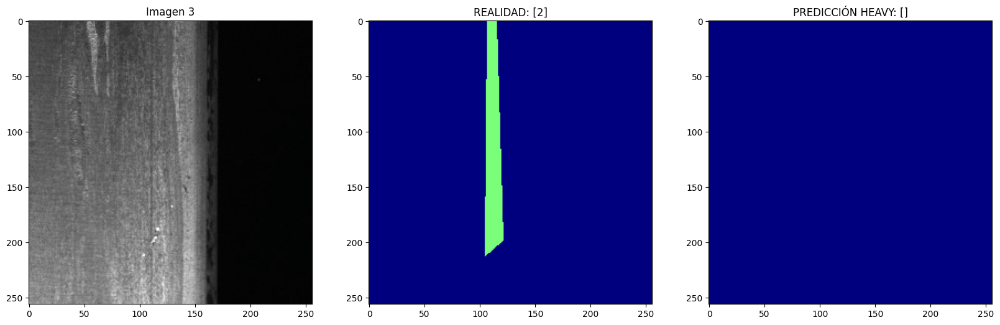

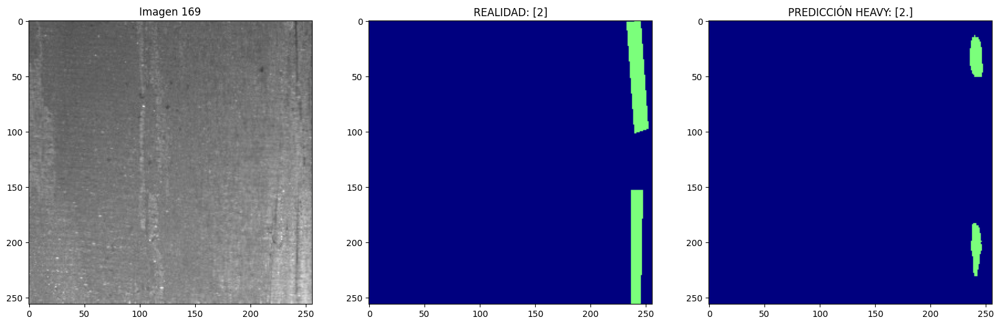

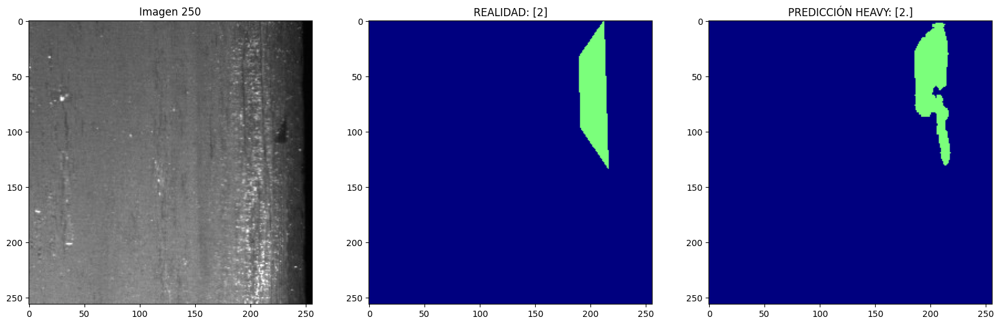

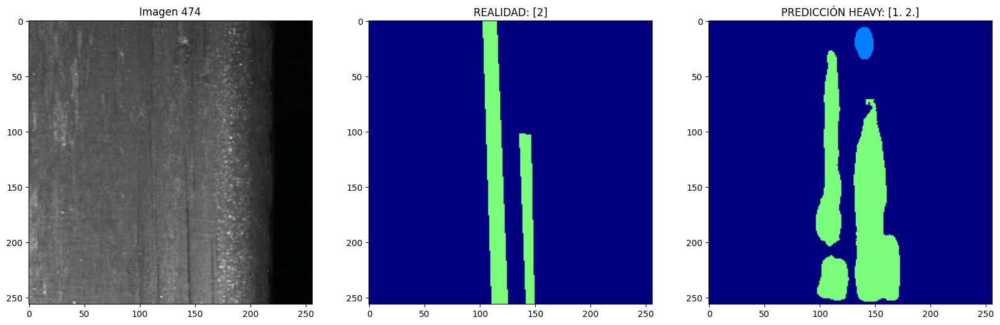

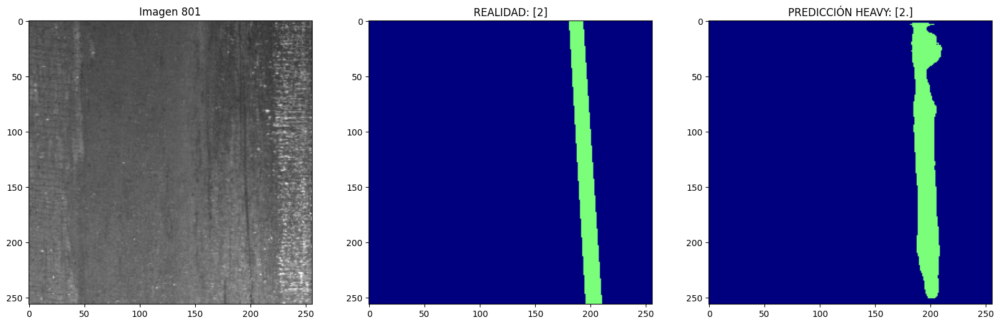

In [71]:
import matplotlib.pyplot as plt
import torch.nn.functional as F
from skimage import morphology

# ==========================================
# 🎨 VISUALIZADOR FINAL (EFFICIENTNET + TTA)
# ==========================================

# 1. PON AQUÍ LOS NÚMEROS QUE TE DIO EL PASO 1
# (He puesto valores por defecto, cámbialos por los tuyos)
HEAVY_THRESHOLDS = {
    1: 0.85,
    2: 0.65,  # <--- Este es crítico para la clase verde
    3: 0.65,
    4: 0.65
}

# Lógica de Inferencia SOTA
def inference_heavy(model, image_tensor, thresholds):
    # TTA: Normal + Flip H + Flip V
    logits = model(image_tensor)
    probs = torch.sigmoid(logits)

    # Flip H
    img_flip = torch.flip(image_tensor, dims=[3])
    probs_flip = torch.sigmoid(model(img_flip))
    probs_flip = torch.flip(probs_flip, dims=[3])

    # Promedio
    probs = (probs + probs_flip) / 2.0

    # Separar canales
    p1 = probs[0, 1, :, :]
    p2 = probs[0, 2, :, :]
    p3 = probs[0, 3, :, :]
    p4 = probs[0, 4, :, :]

    final_mask = torch.zeros_like(p1)

    # Aplicar umbrales
    m1 = p1 > thresholds[1]
    m2 = p2 > thresholds[2]
    m3 = p3 > thresholds[3]
    m4 = p4 > thresholds[4]

    # Prioridad: Clase 2 gana a Clase 1
    final_mask[m3] = 3
    final_mask[m4] = 4
    final_mask[m2] = 2
    final_mask[m1 & (~m2)] = 1 # Solo pinta 1 si no es 2

    return final_mask.cpu().numpy()

def clean_noise(mask, min_size=300):
    clean = np.zeros_like(mask)
    for i in [1, 2, 3, 4]:
        c_mask = (mask == i)
        if c_mask.sum() > 0:
            c_mask = morphology.remove_small_objects(c_mask.astype(bool), min_size=min_size)
            clean[c_mask] = i
    return clean

# Visualizar
def show_heavy_results(index):
    image, mask = val_ds_severstal[index]
    img_tensor = image.unsqueeze(0).to(DEVICE)

    with torch.no_grad():
        pred_raw = inference_heavy(model_heavy, img_tensor, HEAVY_THRESHOLDS)
        pred_clean = clean_noise(pred_raw)

    # Desnormalizar
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    img_show = image.cpu().numpy().transpose(1, 2, 0) * std + mean
    img_show = np.clip(img_show, 0, 1)

    fig, ax = plt.subplots(1, 3, figsize=(20, 6))
    cmap = plt.get_cmap('jet', 5)

    ax[0].imshow(img_show)
    ax[0].set_title(f"Imagen {index}")

    ax[1].imshow(mask.cpu().numpy(), cmap=cmap, vmin=0, vmax=4)
    ax[1].set_title(f"REALIDAD: {np.unique(mask.numpy()[mask.numpy()!=0])}")

    ax[2].imshow(pred_clean, cmap=cmap, vmin=0, vmax=4)
    ax[2].set_title(f"PREDICCIÓN HEAVY: {np.unique(pred_clean[pred_clean!=0])}")
    plt.show()

print("🚀 Buscando ejemplos de Clase 2 para visualizar...")
# Buscamos 3 ejemplos de Clase 2
found = 0
for i in range(len(val_ds_severstal)):
    _, m = val_ds_severstal[i]
    if 2 in m:
        show_heavy_results(i)
        found += 1
    if found >= 5: break

# SegNeXt(Tiny/Base)

In [72]:
!pip install timm segmentation-models-pytorch

In [76]:
import torch
import torch.nn as nn
import torch.optim as optim
import segmentation_models_pytorch as smp
import albumentations as A
from albumentations.pytorch import ToTensorV2
from torch.utils.data import DataLoader
from torch.cuda.amp import GradScaler
import timm
import os
from tqdm import tqdm

# ==========================================
# ⚙️ CONFIGURACIÓN SOTA (ConvNeXt)
# ==========================================
print("\n" + "="*60)
print("🏗️ PREPARANDO ENTORNO PARA CONVNEXT (SOTA)")
print("="*60 + "\n")

# Configuración adaptada a Severstal
CROP_H = 256
CROP_W = 800
# IMPORTANTE: ConvNeXt gasta memoria. Empezamos con 8. Si falla, baja a 4.
BATCH_SIZE_SEG = 8
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# ==========================================
# 1. TRANSFORMACIONES (Corregidas)
# ==========================================
train_transform_segnext = A.Compose([
    # CORRECCIÓN: Usamos p=1.0 en lugar de always_apply
    A.RandomCrop(height=CROP_H, width=CROP_W, p=1.0),

    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.RandomBrightnessContrast(p=0.2),

    # Normalización ImageNet
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2()
])

val_transform_segnext = A.Compose([
    # Validación también con recorte
    A.RandomCrop(height=CROP_H, width=CROP_W, p=1.0),
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2()
])

# ==========================================
# 2. DATALOADERS
# ==========================================
print("🔄 Generando DataLoaders...")
# Asegúrate de que train_ids, val_ids y df_train existen
train_ds_seg = SeverStalDataset(train_ids, df_train, os.path.join(SEVERSTAL_ROOT, 'train/images'), transform=train_transform_segnext)
val_ds_seg = SeverStalDataset(val_ids, df_train, os.path.join(SEVERSTAL_ROOT, 'train/images'), transform=val_transform_segnext)

train_loader_seg = DataLoader(train_ds_seg, batch_size=BATCH_SIZE_SEG, shuffle=True, num_workers=2, pin_memory=True)
val_loader_seg = DataLoader(val_ds_seg, batch_size=BATCH_SIZE_SEG, shuffle=False, num_workers=2, pin_memory=True)

# ==========================================
# 3. MODELO CONVNEXT (El cambio clave)
# ==========================================
print("🧠 Cargando ConvNeXt Tiny (Moderno y Potente)...")

# 'tu-convnext_tiny' es el equilibrio perfecto para Colab.
# Si quieres arriesgar más memoria: 'tu-convnext_small' o 'tu-convnext_base'
model_segnext = smp.Unet(
    encoder_name='tu-convnext_tiny',
    encoder_weights='imagenet',
    in_channels=3,
    classes=5
)
model_segnext.to(DEVICE)

# ==========================================
# 4. ESTRATEGIA DE ENTRENAMIENTO
# ==========================================

# Loss Ponderada
class_weights = torch.tensor([0.1, 2.0, 10.0, 2.0, 2.0]).to(DEVICE)
ce_weighted = nn.CrossEntropyLoss(weight=class_weights)
dice_loss = smp.losses.DiceLoss(mode='multiclass', from_logits=True)
focal_loss = smp.losses.FocalLoss(mode='multiclass')

def criterion_segnext(preds, targets):
    return (0.4 * ce_weighted(preds, targets) +
            0.3 * dice_loss(preds, targets) +
            0.3 * focal_loss(preds, targets))

# Optimizador AdamW
optimizer_seg = torch.optim.AdamW(model_segnext.parameters(), lr=1e-4, weight_decay=1e-2)

# Scheduler
scheduler_seg = optim.lr_scheduler.CosineAnnealingWarmRestarts(
    optimizer_seg, T_0=10, T_mult=2, eta_min=1e-6
)

scaler = torch.cuda.amp.GradScaler()

# ==========================================
# 5. BUCLE DE ENTRENAMIENTO
# ==========================================
SEGNEXT_EPOCHS = 40
best_iou_seg = 0.0

print(f"\n🚀 INICIANDO ENTRENAMIENTO CONVNEXT ({SEGNEXT_EPOCHS} Épocas)")

for epoch in range(SEGNEXT_EPOCHS):
    print(f"\nEpoch {epoch+1}/{SEGNEXT_EPOCHS}")
    print("-" * 60)

    # Train
    train_loss, train_iou, train_ious = train_one_epoch(
        model_segnext, train_loader_seg, criterion_segnext,
        optimizer_seg, scaler, DEVICE, 5
    )

    # Val
    val_loss, val_iou, val_ious = validate(
        model_segnext, val_loader_seg, criterion_segnext, DEVICE, 5
    )

    scheduler_seg.step()
    current_lr = optimizer_seg.param_groups[0]['lr']

    print(f"Train Loss: {train_loss:.4f} | Train IoU: {train_iou:.4f}")
    print(f"Val Loss: {val_loss:.4f} | Val IoU: {val_iou:.4f}")

    iou_str = [f'{x:.3f}' for x in val_ious] if isinstance(val_ious, (list, np.ndarray)) else f"{val_ious:.3f}"
    print(f"Val IoUs: {iou_str}")
    print(f"LR: {current_lr:.7f}")

    if val_iou > best_iou_seg:
        best_iou_seg = val_iou
        torch.save(model_segnext.state_dict(), 'severstal_convnext_best.pth')
        print(f"🔥 ¡NUEVO RÉCORD! IoU: {best_iou_seg:.4f}")

print(f"\n{'='*60}")
print(f"🏆 ENTRENAMIENTO FINALIZADO - Mejor IoU: {best_iou_seg:.4f}")


🏗️ PREPARANDO ENTORNO PARA CONVNEXT (SOTA)

🔄 Generando DataLoaders...


Indexando RLEs: 100%|██████████| 6666/6666 [00:00<00:00, 10989.55it/s]


🧠 Cargando ConvNeXt Tiny (Moderno y Potente)...


/tmp/ipython-input-1915623553.py:99: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler()



🚀 INICIANDO ENTRENAMIENTO CONVNEXT (40 Épocas)

Epoch 1/40
------------------------------------------------------------


Training (AMP):   0%|          | 0/709 [00:00<?, ?it/s]/tmp/ipython-input-1131897335.py:58: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=True):
Validation: 100%|██████████| 125/125 [00:11<00:00, 10.73it/s]


Train Loss: 0.4536 | Train IoU: 0.2687
Val Loss: 0.3969 | Val IoU: 0.2649
Val IoUs: ['0.933', '0.000', '0.000', '0.391', '0.000']
LR: 0.0000976
🔥 ¡NUEVO RÉCORD! IoU: 0.2649

Epoch 2/40
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:09<00:00, 13.33it/s]


Train Loss: 0.2924 | Train IoU: 0.3324
Val Loss: 0.2422 | Val IoU: 0.3632
Val IoUs: ['0.920', '0.124', '0.028', '0.447', '0.297']
LR: 0.0000905
🔥 ¡NUEVO RÉCORD! IoU: 0.3632

Epoch 3/40
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:09<00:00, 13.36it/s]


Train Loss: 0.2417 | Train IoU: 0.3622
Val Loss: 0.2087 | Val IoU: 0.4051
Val IoUs: ['0.937', '0.171', '0.033', '0.486', '0.397']
LR: 0.0000796
🔥 ¡NUEVO RÉCORD! IoU: 0.4051

Epoch 4/40
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:09<00:00, 13.42it/s]


Train Loss: 0.2188 | Train IoU: 0.3824
Val Loss: 0.2090 | Val IoU: 0.4107
Val IoUs: ['0.929', '0.235', '0.063', '0.443', '0.383']
LR: 0.0000658
🔥 ¡NUEVO RÉCORD! IoU: 0.4107

Epoch 5/40
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:09<00:00, 13.47it/s]


Train Loss: 0.1940 | Train IoU: 0.4040
Val Loss: 0.2424 | Val IoU: 0.4292
Val IoUs: ['0.951', '0.186', '0.036', '0.509', '0.464']
LR: 0.0000505
🔥 ¡NUEVO RÉCORD! IoU: 0.4292

Epoch 6/40
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:09<00:00, 13.26it/s]


Train Loss: 0.1857 | Train IoU: 0.4256
Val Loss: 0.1997 | Val IoU: 0.4270
Val IoUs: ['0.946', '0.212', '0.043', '0.519', '0.415']
LR: 0.0000352

Epoch 7/40
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:09<00:00, 13.25it/s]


Train Loss: 0.1676 | Train IoU: 0.4464
Val Loss: 0.1813 | Val IoU: 0.4573
Val IoUs: ['0.939', '0.320', '0.116', '0.499', '0.413']
LR: 0.0000214
🔥 ¡NUEVO RÉCORD! IoU: 0.4573

Epoch 8/40
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:09<00:00, 13.41it/s]


Train Loss: 0.1576 | Train IoU: 0.4573
Val Loss: 0.1655 | Val IoU: 0.4601
Val IoUs: ['0.948', '0.253', '0.045', '0.537', '0.518']
LR: 0.0000105
🔥 ¡NUEVO RÉCORD! IoU: 0.4601

Epoch 9/40
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:09<00:00, 13.47it/s]


Train Loss: 0.1453 | Train IoU: 0.4751
Val Loss: 0.1636 | Val IoU: 0.4695
Val IoUs: ['0.945', '0.305', '0.067', '0.518', '0.513']
LR: 0.0000034
🔥 ¡NUEVO RÉCORD! IoU: 0.4695

Epoch 10/40
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:09<00:00, 13.37it/s]


Train Loss: 0.1428 | Train IoU: 0.4792
Val Loss: 0.1617 | Val IoU: 0.4889
Val IoUs: ['0.952', '0.321', '0.091', '0.548', '0.532']
LR: 0.0001000
🔥 ¡NUEVO RÉCORD! IoU: 0.4889

Epoch 11/40
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:09<00:00, 13.36it/s]


Train Loss: 0.2110 | Train IoU: 0.3948
Val Loss: 0.1903 | Val IoU: 0.4474
Val IoUs: ['0.943', '0.239', '0.094', '0.500', '0.462']
LR: 0.0000994

Epoch 12/40
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:09<00:00, 13.38it/s]


Train Loss: 0.1972 | Train IoU: 0.4012
Val Loss: 0.1991 | Val IoU: 0.3950
Val IoUs: ['0.926', '0.210', '0.081', '0.487', '0.271']
LR: 0.0000976

Epoch 13/40
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:09<00:00, 13.28it/s]


Train Loss: 0.1831 | Train IoU: 0.4198
Val Loss: 0.2000 | Val IoU: 0.3841
Val IoUs: ['0.919', '0.157', '0.019', '0.456', '0.370']
LR: 0.0000946

Epoch 14/40
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:09<00:00, 13.17it/s]


Train Loss: 0.1707 | Train IoU: 0.4313
Val Loss: 0.2134 | Val IoU: 0.4173
Val IoUs: ['0.931', '0.275', '0.150', '0.489', '0.241']
LR: 0.0000905

Epoch 15/40
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:09<00:00, 13.35it/s]


Train Loss: 0.1701 | Train IoU: 0.4295
Val Loss: 0.1769 | Val IoU: 0.4639
Val IoUs: ['0.938', '0.263', '0.119', '0.473', '0.528']
LR: 0.0000855

Epoch 16/40
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:09<00:00, 13.23it/s]


Train Loss: 0.1630 | Train IoU: 0.4502
Val Loss: 0.1823 | Val IoU: 0.3981
Val IoUs: ['0.932', '0.237', '0.066', '0.487', '0.268']
LR: 0.0000796

Epoch 17/40
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:09<00:00, 13.31it/s]


Train Loss: 0.1581 | Train IoU: 0.4578
Val Loss: 0.1728 | Val IoU: 0.4727
Val IoUs: ['0.954', '0.290', '0.104', '0.556', '0.460']
LR: 0.0000730

Epoch 18/40
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:09<00:00, 13.26it/s]


Train Loss: 0.1516 | Train IoU: 0.4672
Val Loss: 0.1771 | Val IoU: 0.4243
Val IoUs: ['0.933', '0.295', '0.041', '0.474', '0.378']
LR: 0.0000658

Epoch 19/40
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:09<00:00, 13.37it/s]


Train Loss: 0.1412 | Train IoU: 0.4721
Val Loss: 0.1670 | Val IoU: 0.4880
Val IoUs: ['0.943', '0.394', '0.145', '0.507', '0.451']
LR: 0.0000582

Epoch 20/40
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:09<00:00, 13.23it/s]


Train Loss: 0.1402 | Train IoU: 0.4799
Val Loss: 0.1660 | Val IoU: 0.4833
Val IoUs: ['0.939', '0.332', '0.205', '0.499', '0.441']
LR: 0.0000505

Epoch 21/40
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:09<00:00, 13.38it/s]


Train Loss: 0.1297 | Train IoU: 0.5052
Val Loss: 0.1687 | Val IoU: 0.5152
Val IoUs: ['0.947', '0.380', '0.240', '0.525', '0.484']
LR: 0.0000428
🔥 ¡NUEVO RÉCORD! IoU: 0.5152

Epoch 22/40
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:09<00:00, 13.33it/s]


Train Loss: 0.1287 | Train IoU: 0.5118
Val Loss: 0.1540 | Val IoU: 0.4947
Val IoUs: ['0.950', '0.392', '0.117', '0.541', '0.475']
LR: 0.0000352

Epoch 23/40
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:09<00:00, 13.44it/s]


Train Loss: 0.1194 | Train IoU: 0.5163
Val Loss: 0.1567 | Val IoU: 0.4986
Val IoUs: ['0.952', '0.400', '0.064', '0.549', '0.527']
LR: 0.0000280

Epoch 24/40
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:09<00:00, 13.37it/s]


Train Loss: 0.1161 | Train IoU: 0.5345
Val Loss: 0.1647 | Val IoU: 0.5379
Val IoUs: ['0.957', '0.412', '0.194', '0.564', '0.562']
LR: 0.0000214
🔥 ¡NUEVO RÉCORD! IoU: 0.5379

Epoch 25/40
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:09<00:00, 13.32it/s]


Train Loss: 0.1112 | Train IoU: 0.5504
Val Loss: 0.1529 | Val IoU: 0.5442
Val IoUs: ['0.957', '0.436', '0.207', '0.567', '0.554']
LR: 0.0000155
🔥 ¡NUEVO RÉCORD! IoU: 0.5442

Epoch 26/40
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:09<00:00, 13.37it/s]


Train Loss: 0.1089 | Train IoU: 0.5613
Val Loss: 0.1556 | Val IoU: 0.5256
Val IoUs: ['0.955', '0.397', '0.219', '0.565', '0.493']
LR: 0.0000105

Epoch 27/40
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:09<00:00, 13.50it/s]


Train Loss: 0.1054 | Train IoU: 0.5663
Val Loss: 0.1549 | Val IoU: 0.5304
Val IoUs: ['0.955', '0.407', '0.202', '0.559', '0.529']
LR: 0.0000064

Epoch 28/40
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:09<00:00, 13.45it/s]


Train Loss: 0.1021 | Train IoU: 0.5790
Val Loss: 0.1542 | Val IoU: 0.5405
Val IoUs: ['0.956', '0.408', '0.208', '0.564', '0.567']
LR: 0.0000034

Epoch 29/40
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:09<00:00, 13.39it/s]


Train Loss: 0.1013 | Train IoU: 0.5817
Val Loss: 0.1568 | Val IoU: 0.5493
Val IoUs: ['0.958', '0.414', '0.249', '0.574', '0.551']
LR: 0.0000016
🔥 ¡NUEVO RÉCORD! IoU: 0.5493

Epoch 30/40
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:09<00:00, 13.33it/s]


Train Loss: 0.0997 | Train IoU: 0.5826
Val Loss: 0.1562 | Val IoU: 0.5423
Val IoUs: ['0.957', '0.421', '0.227', '0.572', '0.534']
LR: 0.0001000

Epoch 31/40
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:09<00:00, 13.35it/s]


Train Loss: 0.1537 | Train IoU: 0.4609
Val Loss: 0.1833 | Val IoU: 0.4684
Val IoUs: ['0.938', '0.336', '0.166', '0.479', '0.423']
LR: 0.0000998

Epoch 32/40
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:09<00:00, 13.35it/s]


Train Loss: 0.1547 | Train IoU: 0.4679
Val Loss: 0.1714 | Val IoU: 0.4644
Val IoUs: ['0.941', '0.328', '0.081', '0.504', '0.467']
LR: 0.0000994

Epoch 33/40
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:09<00:00, 13.31it/s]


Train Loss: 0.1467 | Train IoU: 0.4685
Val Loss: 0.1593 | Val IoU: 0.4901
Val IoUs: ['0.949', '0.276', '0.172', '0.531', '0.523']
LR: 0.0000986

Epoch 34/40
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:09<00:00, 13.38it/s]


Train Loss: 0.1459 | Train IoU: 0.4784
Val Loss: 0.1641 | Val IoU: 0.4737
Val IoUs: ['0.950', '0.282', '0.148', '0.541', '0.448']
LR: 0.0000976

Epoch 35/40
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:09<00:00, 13.30it/s]


Train Loss: 0.1347 | Train IoU: 0.4868
Val Loss: 0.1588 | Val IoU: 0.4918
Val IoUs: ['0.946', '0.421', '0.060', '0.513', '0.519']
LR: 0.0000962

Epoch 36/40
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:09<00:00, 13.22it/s]


Train Loss: 0.1403 | Train IoU: 0.4873
Val Loss: 0.1725 | Val IoU: 0.4672
Val IoUs: ['0.949', '0.283', '0.119', '0.525', '0.460']
LR: 0.0000946

Epoch 37/40
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:09<00:00, 13.24it/s]


Train Loss: 0.1343 | Train IoU: 0.4918
Val Loss: 0.1616 | Val IoU: 0.4536
Val IoUs: ['0.945', '0.235', '0.116', '0.518', '0.454']
LR: 0.0000927

Epoch 38/40
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:09<00:00, 13.29it/s]


Train Loss: 0.1340 | Train IoU: 0.4886
Val Loss: 0.1773 | Val IoU: 0.4907
Val IoUs: ['0.955', '0.293', '0.213', '0.556', '0.436']
LR: 0.0000905

Epoch 39/40
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:09<00:00, 13.43it/s]


Train Loss: 0.1245 | Train IoU: 0.5060
Val Loss: 0.1793 | Val IoU: 0.4582
Val IoUs: ['0.938', '0.303', '0.050', '0.489', '0.510']
LR: 0.0000881

Epoch 40/40
------------------------------------------------------------


Validation: 100%|██████████| 125/125 [00:09<00:00, 13.10it/s]

Train Loss: 0.1226 | Train IoU: 0.5041
Val Loss: 0.1675 | Val IoU: 0.4917
Val IoUs: ['0.949', '0.354', '0.105', '0.527', '0.523']
LR: 0.0000855

🏆 ENTRENAMIENTO FINALIZADO - Mejor IoU: 0.5493


In [ ]:
# ==========================================
# 🔄 SCRIPT DE RESCATE: DÍA 2 (SEVERSTAL)
# ==========================================

import os
import cv2
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import segmentation_models_pytorch as smp
import albumentations as A
from albumentations.pytorch import ToTensorV2
from torch.utils.data import DataLoader, Dataset
from torch.cuda.amp import GradScaler
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import timm

# 1. CONFIGURACIÓN BÁSICA
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
BATCH_SIZE = 8
CROP_H, CROP_W = 256, 800
SEVERSTAL_ROOT = '/content/severstal-steel-defect-detection' # <--- AJUSTA ESTA RUTA SI ES DISTINTA

print(f"✅ Entorno listo. Usando {DEVICE}")

# ==========================================
# 2. DEFINICIÓN DEL DATASET Y SPLIT (Vital para consistencia)
# ==========================================
class SeverStalDataset(Dataset):
    def __init__(self, img_ids, df, root, transform=None):
        self.root = root
        self.img_ids = img_ids
        self.df = df
        self.transform = transform

        # Crear índice rápido de máscaras
        self.rle_index = {}
        group = df.groupby('ImageId')
        for img_id, g in group:
            self.rle_index[img_id] = g

    def __len__(self):
        return len(self.img_ids)

    def __getitem__(self, idx):
        img_id = self.img_ids[idx]
        path = os.path.join(self.root, img_id)
        img = cv2.imread(path)
        if img is None: return torch.zeros((3, 256, 1600)), torch.zeros((256, 1600))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Construir máscara
        mask = np.zeros((256, 1600), dtype=np.uint8)
        if img_id in self.rle_index:
            rows = self.rle_index[img_id]
            for _, row in rows.iterrows():
                rle = row['EncodedPixels']
                cls = int(row['ClassId'])
                if isinstance(rle, str):
                    mask += self.rle_decode(rle, cls)

        # Transformaciones
        if self.transform:
            aug = self.transform(image=img, mask=mask)
            img = aug['image']
            mask = aug['mask']

        return img, mask.long()

    def rle_decode(self, mask_rle, cls_val, shape=(256, 1600)):
        s = mask_rle.split()
        starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]
        starts -= 1
        ends = starts + lengths
        img = np.zeros(shape[0]*shape[1], dtype=np.uint8)
        for lo, hi in zip(starts, ends):
            img[lo:hi] = cls_val
        return img.reshape(shape, order='F')

# Cargar DF y hacer Split (Igual que ayer para no mezclar datos)
df_train = pd.read_csv(os.path.join(SEVERSTAL_ROOT, 'train.csv'))
df_train['ImageId'] = df_train['ImageId_ClassId'].apply(lambda x: x.split('_')[0])
unique_ids = df_train['ImageId'].unique().tolist()

train_ids, val_ids = train_test_split(unique_ids, test_size=0.2, random_state=42)

# Transformaciones
train_trans = A.Compose([
    A.RandomCrop(height=CROP_H, width=CROP_W, p=1.0),
    A.HorizontalFlip(p=0.5), A.VerticalFlip(p=0.5),
    A.RandomBrightnessContrast(p=0.2),
    A.Normalize(), ToTensorV2()
])
val_trans = A.Compose([
    A.RandomCrop(height=CROP_H, width=CROP_W, p=1.0),
    A.Normalize(), ToTensorV2()
])

# Loaders
train_loader = DataLoader(SeverStalDataset(train_ids, df_train, os.path.join(SEVERSTAL_ROOT, 'train_images'), transform=train_trans),
                          batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
val_loader = DataLoader(SeverStalDataset(val_ids, df_train, os.path.join(SEVERSTAL_ROOT, 'train_images'), transform=val_trans),
                        batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

print("🔄 DataLoaders restaurados correctamente.")

# ==========================================
# 3. CARGAR MODELO GUARDADO
# ==========================================
print("📂 Cargando ConvNeXt Tiny desde Drive...")
from google.colab import drive
drive.mount('/content/drive')

# AJUSTA ESTA RUTA si la cambiaste
ruta_modelo = '/content/drive/MyDrive/Modelos_Severstal/severstal_convnext_best.pth'

model = smp.Unet(encoder_name='tu-convnext_tiny', encoder_weights=None, in_channels=3, classes=5)

try:
    model.load_state_dict(torch.load(ruta_modelo, map_location=DEVICE))
    model.to(DEVICE)
    print("✅ ¡ÉXITO! Tu modelo de ayer (IoU ~0.55) está cargado y listo.")
except FileNotFoundError:
    print(f"❌ ERROR CRÍTICO: No encuentro {ruta_modelo}. Verifica tu Drive.")

# ==========================================
# 4. CONFIGURAR PRÓRROGA (Training Extension)
# ==========================================
# Loss
class_weights = torch.tensor([0.1, 2.0, 10.0, 2.0, 2.0]).to(DEVICE)
criterion = lambda p, t: 0.4*nn.CrossEntropyLoss(weight=class_weights)(p,t) + 0.3*smp.losses.DiceLoss('multiclass', from_logits=True)(p,t) + 0.3*smp.losses.FocalLoss('multiclass')(p,t)

# Optimizador: LR más bajo para "afinar" (Fine-Tuning)
optimizer = torch.optim.AdamW(model.parameters(), lr=5e-5, weight_decay=1e-2)
scaler = torch.amp.GradScaler('cuda')

# Scheduler: Un ciclo suave de 30 épocas
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=30, eta_min=1e-7)

# ==========================================
# 5. BUCLE DE ENTRENAMIENTO (PRÓRROGA)
# ==========================================
# Copiamos la función de entrenamiento simple aquí para que no falte nada
def train_epoch(loader):
    model.train()
    total_loss = 0
    pbar = tqdm(loader, desc="Training")
    for img, mask in pbar:
        img, mask = img.to(DEVICE), mask.to(DEVICE)
        optimizer.zero_grad()
        with torch.amp.autocast('cuda'):
            out = model(img)
            loss = criterion(out, mask)
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        total_loss += loss.item()
        pbar.set_postfix({'loss': f"{loss.item():.4f}"})
    return total_loss / len(loader)

def validate_epoch(loader):
    model.eval()
    all_ious = []
    with torch.no_grad():
        for img, mask in tqdm(loader, desc="Validating"):
            img, mask = img.to(DEVICE), mask.cpu().numpy()
            out = model(img)
            pred = out.argmax(dim=1).cpu().numpy()
            # IoU simple por batch
            for c in [1, 2, 3, 4]:
                inter = np.logical_and(pred==c, mask==c).sum()
                union = np.logical_or(pred==c, mask==c).sum()
                if union > 0: all_ious.append(inter/union)
    return np.mean(all_ious) if all_ious else 0.0

# START
EPOCHS = 30
best_iou = 0.5493 # Tu récord actual

print(f"\n🚀 INICIANDO PRÓRROGA DE {EPOCHS} ÉPOCAS. A POR EL RÉCORD!")

for epoch in range(EPOCHS):
    print(f"\nEpoch {epoch+1}/{EPOCHS}")
    t_loss = train_epoch(train_loader)
    v_iou = validate_epoch(val_loader)
    scheduler.step()

    print(f"Train Loss: {t_loss:.4f} | Val IoU Global: {v_iou:.4f}")

    if v_iou > best_iou:
        best_iou = v_iou
        torch.save(model.state_dict(), '/content/drive/MyDrive/Modelos_Severstal/severstal_convnext_FINAL.pth')
        print(f"🔥 ¡NUEVO RÉCORD ABSOLUTO! IoU: {best_iou:.4f} (Guardado en Drive)")

print("\n🏆 FIN DEL ENTRENAMIENTO.")

In [77]:
import numpy as np
from tqdm import tqdm
from sklearn.metrics import f1_score
import torch

# ==========================================
# 🔍 BUSCADOR DE UMBRALES (CONVNEXT)
# ==========================================

def get_predictions_convnext(model, loader, device):
    model.eval()
    all_probs = []
    all_masks = []

    print("📥 Extrayendo probabilidades del modelo ConvNeXt...")
    with torch.no_grad():
        for images, masks in tqdm(loader, desc="Inferencia"):
            images = images.to(device)

            # TTA Simple (Normal + Flip Horizontal)
            # Esto mejora la robustez de las predicciones
            out1 = model(images)
            out2 = model(torch.flip(images, dims=[3]))
            out2 = torch.flip(out2, dims=[3])

            # Promedio de las dos vistas
            probs = (torch.sigmoid(out1) + torch.sigmoid(out2)) / 2.0

            all_probs.append(probs.cpu().numpy())
            all_masks.append(masks.numpy())

    return np.concatenate(all_probs), np.concatenate(all_masks)

# 1. Extraemos datos (Tardará 2-3 min dependiendo de la GPU)
# Usamos 'val_loader_seg' que definiste para ConvNeXt
y_prob, y_true = get_predictions_convnext(model_segnext, val_loader_seg, DEVICE)

# 2. Función de optimización
def find_best_th(probs, targets, class_id):
    best_th = 0.5
    best_score = -1

    # Aplanamos los datos de esa clase específica
    y_true_c = (targets == class_id).astype(np.uint8).reshape(-1)
    y_prob_c = probs[:, class_id, :, :].reshape(-1)

    # Probamos umbrales de 0.10 a 0.90
    for th in np.arange(0.1, 0.95, 0.05):
        y_pred = (y_prob_c > th).astype(np.uint8)
        score = f1_score(y_true_c, y_pred, zero_division=1)
        if score > best_score:
            best_score = score
            best_th = th
    return best_th, best_score

print("\n" + "="*40)
print("🤖 UMBRALES RECOMENDADOS (Úsalos en el siguiente paso)")
print("="*40)

# Guardamos los resultados aquí
MIS_UMBRALES = {}

for cls in [1, 2, 3, 4]:
    th, score = find_best_th(y_prob, y_true, cls)
    MIS_UMBRALES[cls] = th
    print(f"✅ Clase {cls}: Umbral {th:.2f} (Dice Score: {score:.4f})")

📥 Extrayendo probabilidades del modelo ConvNeXt...


Inferencia: 100%|██████████| 125/125 [00:12<00:00,  9.99it/s]



🤖 UMBRALES RECOMENDADOS (Úsalos en el siguiente paso)
✅ Clase 1: Umbral 0.80 (Dice Score: 0.6324)


KeyboardInterrupt: 

🚀 Visualizando resultados usando umbrales: {1: 0.8, 2: 0.65, 3: 0.65, 4: 0.65}
   Buscando defectos difíciles...


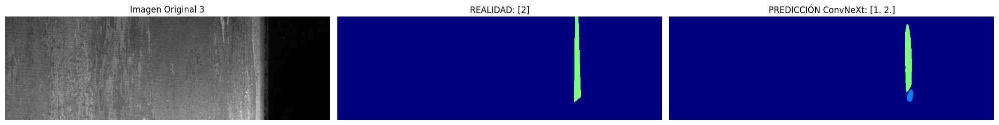

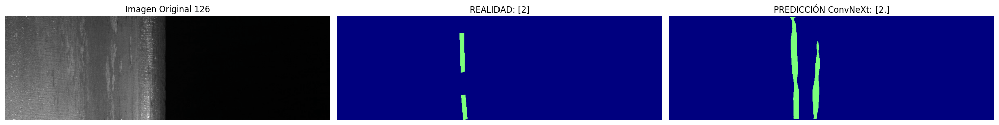

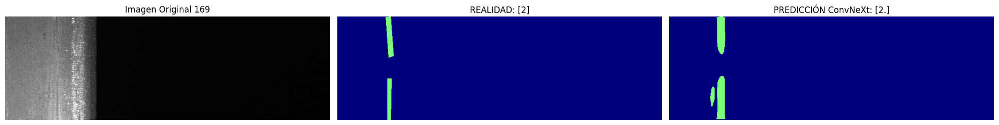

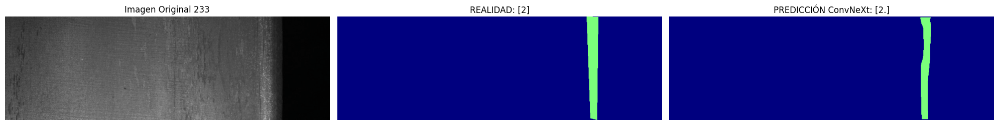

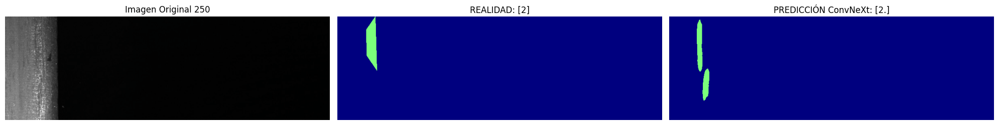

...

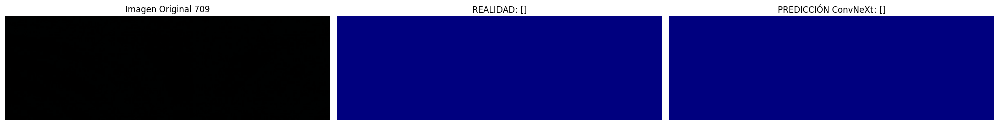

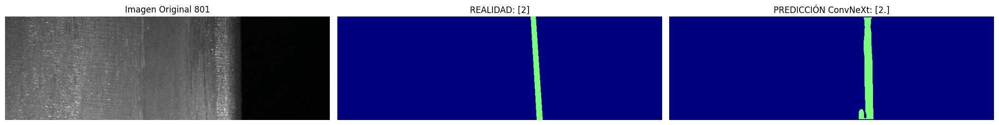

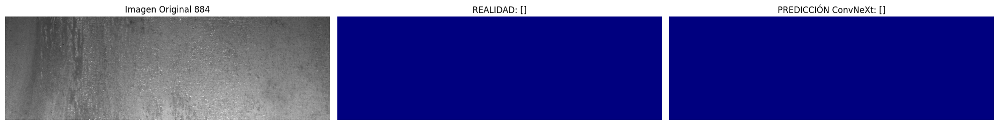

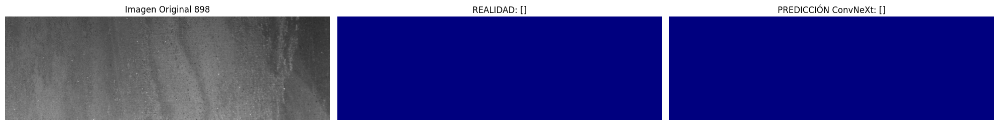

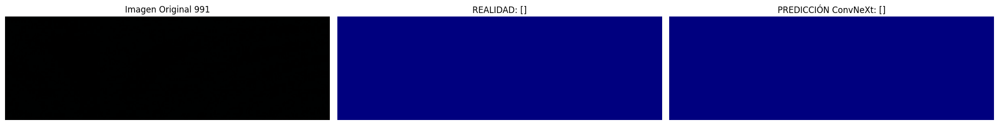

Solo encontré 14 de Clase 2. Buscando otros defectos...


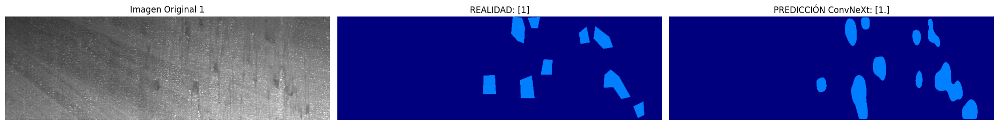

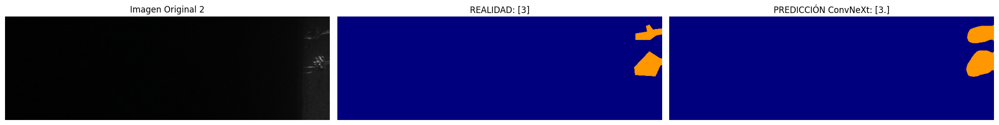

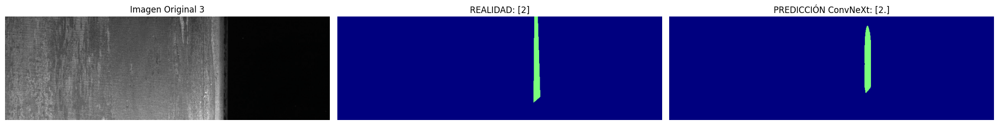

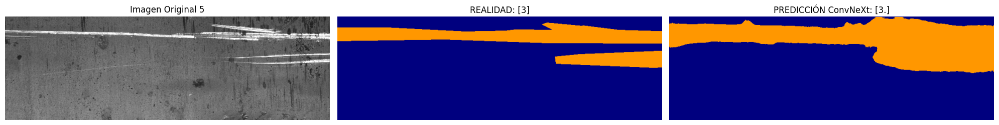

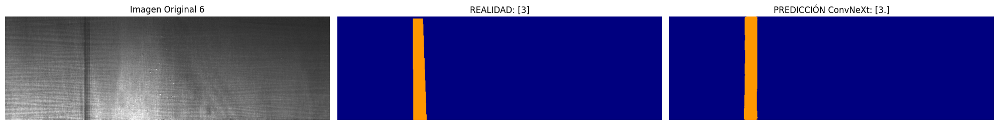

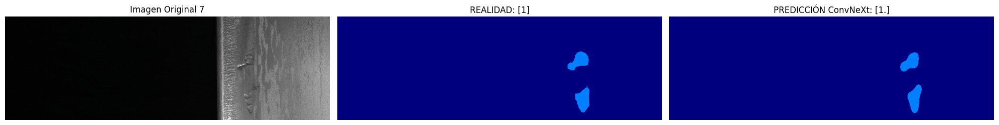

In [81]:
import matplotlib.pyplot as plt
import torch.nn.functional as F
from skimage import morphology

# ==========================================
# 🎨 VISUALIZADOR FINAL (SOTA)
# ==========================================

# Lógica de Inferencia Inteligente
def inference_smart(model, image_tensor, thresholds):
    # 1. TTA: Normal + Flip Horizontal + Flip Vertical
    logits = model(image_tensor)
    probs = torch.sigmoid(logits)

    # Flip H
    img_flip_h = torch.flip(image_tensor, dims=[3])
    probs_h = torch.sigmoid(model(img_flip_h))
    probs_h = torch.flip(probs_h, dims=[3])

    # Flip V
    img_flip_v = torch.flip(image_tensor, dims=[2])
    probs_v = torch.sigmoid(model(img_flip_v))
    probs_v = torch.flip(probs_v, dims=[2])

    # Promedio robusto
    probs = (probs + probs_h + probs_v) / 3.0

    # 2. Aplicar Umbrales
    p1 = probs[0, 1, :, :]
    p2 = probs[0, 2, :, :]
    p3 = probs[0, 3, :, :]
    p4 = probs[0, 4, :, :]

    final_mask = torch.zeros_like(p1)

    m1 = p1 > thresholds[1]
    m2 = p2 > thresholds[2] # Umbral crítico
    m3 = p3 > thresholds[3]
    m4 = p4 > thresholds[4]

    # 3. Prioridad de Clases (Verde > Azul)
    final_mask[m3] = 3
    final_mask[m4] = 4
    final_mask[m2] = 2 # La clase difícil manda
    final_mask[m1 & (~m2)] = 1 # Clase 1 solo si no es Clase 2

    return final_mask.cpu().numpy()

def clean_noise(mask, min_size=300):
    """Elimina manchitas pequeñas"""
    clean = np.zeros_like(mask)
    for i in [1, 2, 3, 4]:
        c_mask = (mask == i)
        if c_mask.sum() > 0:
            c_mask = morphology.remove_small_objects(c_mask.astype(bool), min_size=min_size)
            clean[c_mask] = i
    return clean

def show_results(dataset, index):
    image, mask = dataset[index]
    img_tensor = image.unsqueeze(0).to(DEVICE)

    with torch.no_grad():
        # Usamos los umbrales calculados en el Paso 1
        pred_raw = inference_smart(model_segnext, img_tensor, MIS_UMBRALES)
        pred_clean = clean_noise(pred_raw)

    # Desnormalizar para ver la foto bien
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    img_show = image.cpu().numpy().transpose(1, 2, 0) * std + mean
    img_show = np.clip(img_show, 0, 1)

    # GRÁFICOS
    fig, ax = plt.subplots(1, 3, figsize=(20, 5))
    cmap = plt.get_cmap('jet', 5)

    ax[0].imshow(img_show)
    ax[0].set_title(f"Imagen Original {index}")
    ax[0].axis('off')

    ax[1].imshow(mask.cpu().numpy(), cmap=cmap, vmin=0, vmax=4)
    true_cls = np.unique(mask.numpy()[mask.numpy()!=0])
    ax[1].set_title(f"REALIDAD: {true_cls}")
    ax[1].axis('off')

    ax[2].imshow(pred_clean, cmap=cmap, vmin=0, vmax=4)
    pred_cls = np.unique(pred_clean[pred_clean!=0])
    ax[2].set_title(f"PREDICCIÓN ConvNeXt: {pred_cls}")
    ax[2].axis('off')

    plt.tight_layout()
    plt.show()

# -------------------------------------------------
# 🔍 BUSCAR EJEMPLOS INTERESANTES (Clase 2)
# -------------------------------------------------
# 1. CORRECCIÓN DE UMBRALES (Formato Diccionario)
MIS_UMBRALES = {
    1: 0.80,
    2: 0.65,
    3: 0.65,
    4: 0.65
}

print(f"🚀 Visualizando resultados usando umbrales: {MIS_UMBRALES}")
print("   Buscando defectos difíciles...")

count = 0
NUM_IMAGENES_A_VER = 20  # <--- ¡CAMBIA ESTO PARA VER MÁS!

# Recorremos validación buscando ejemplos
for i in range(len(val_ds_seg)):
    _, m = val_ds_seg[i]

    # Prioridad: Mostrar Clase 2 si existe
    if 2 in m:
        show_results(val_ds_seg, i)
        count += 1

    # Si llevamos X ejemplos, paramos
    if count >= NUM_IMAGENES_A_VER:  # <--- AQUÍ ESTÁ EL LÍMITE
        break

# Si no encontró suficientes de clase 2, rellenamos con otros defectos
if count < NUM_IMAGENES_A_VER:
    print(f"Solo encontré {count} de Clase 2. Buscando otros defectos...")
    for i in range(len(val_ds_seg)):
        _, m = val_ds_seg[i]
        # Mostramos si tiene cualquier defecto (max > 0) y no lo hemos mostrado ya
        if m.max() > 0:
            # (Nota: Aquí simplificamos, en un código estricto evitaríamos repetidos,
            # pero para visualizar rápido vale)
            show_results(val_ds_seg, i)
            count += 1
        if count >= NUM_IMAGENES_A_VER: break